# Your First GAN

### Goal
In this notebook, you're going to create your first generative adversarial network (GAN) for this course! Specifically, you will build and train a GAN that can generate hand-written images of digits (0-9). You will be using PyTorch in this specialization, so if you're not familiar with this framework, you may find the [PyTorch documentation](https://pytorch.org/docs/stable/index.html) useful. The hints will also often include links to relevant documentation.

### Learning Objectives
1.   Build the generator and discriminator components of a GAN from scratch.
2.   Create generator and discriminator loss functions.
3.   Train your GAN and visualize the generated images.


## Getting Started
You will begin by importing some useful packages and the dataset you will use to build and train your GAN. You are also provided with a visualizer function to help you investigate the images your GAN will create.


In [1]:
import torch

In [3]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST # Training dataset
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
#__name__ == "__main__"

#torch.multiprocessing.set_start_method('spawn', force="True")
torch.manual_seed(0) # Set for testing purposes, please do not change!
num_workers=1
def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in a uniform grid.
    '''
    image_unflat = image_tensor.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

#### MNIST Dataset
The training images your discriminator will be using is from a dataset called [MNIST](http://yann.lecun.com/exdb/mnist/). It contains 60,000 images of handwritten digits, from 0 to 9, like these:

![MNIST Digits](https://upload.wikimedia.org/wikipedia/commons/2/27/MnistExamples.png)

You may notice that the images are quite pixelated -- this is because they are all only 28 x 28! The small size of its images makes MNIST ideal for simple training. Additionally, these images are also in black-and-white so only one dimension, or "color channel", is needed to represent them (more on this later in the course).

#### Tensor
You will represent the data using [tensors](https://pytorch.org/docs/stable/tensors.html). Tensors are a generalization of matrices: for example, a stack of three matrices with the amounts of red, green, and blue at different locations in a 64 x 64 pixel image is a tensor with the shape 3 x 64 x 64.

Tensors are easy to manipulate and supported by [PyTorch](https://pytorch.org/), the machine learning library you will be using. Feel free to explore them more, but you can imagine these as multi-dimensional matrices or vectors!

#### Batches
While you could train your model after generating one image, it is extremely inefficient and leads to less stable training. In GANs, and in machine learning in general, you will process multiple images per training step. These are called batches.

This means that your generator will generate an entire batch of images and receive the discriminator's feedback on each before updating the model. The same goes for the discriminator, it will calculate its loss on the entire batch of generated images as well as on the reals before the model is updated.

## Generator
The first step is to build the generator component.

You will start by creating a function to make a single layer/block for the generator's neural network. Each block should include a [linear transformation](https://pytorch.org/docs/stable/generated/torch.nn.Linear.html) to map to another shape, a [batch normalization](https://pytorch.org/docs/stable/generated/torch.nn.BatchNorm1d.html) for stabilization, and finally a non-linear activation function (you use a [ReLU here](https://pytorch.org/docs/master/generated/torch.nn.ReLU.html)) so the output can be transformed in complex ways. You will learn more about activations and batch normalization later in the course.

In [4]:
# UNQ_C1 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_generator_block
def get_generator_block(input_dim, output_dim):
    '''
    Function for returning a block of the generator's neural network
    given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a generator neural network layer, with a linear transformation 
          followed by a batch normalization and then a relu activation
    '''
    return nn.Sequential(  ##  It then "chains" outputs to inputs sequentially
        
        # Hint: Replace all of the "None" with the appropriate dimensions.
        # The documentation may be useful if you're less familiar with PyTorch:
        # https://pytorch.org/docs/stable/nn.html.
        #### START CODE HERE ####
        nn.Linear(input_dim, output_dim),  ##Applies a linear transformation to the incoming data: :math:`y = xA^T + b`
        nn.BatchNorm1d(output_dim),   ## """Common base of _InstanceNorm and _BatchNorm"""
        nn.ReLU(inplace=True),     ##""Applies the rectified linear unit function element-wise max(0, in)
        #### END CODE HERE ####
    )

In [5]:
# Verify the generator block function
def test_gen_block(in_features, out_features, num_test=1000):
    block = get_generator_block(in_features, out_features)

    # Check the three parts
    assert len(block) == 3
    assert type(block[0]) == nn.Linear
    assert type(block[1]) == nn.BatchNorm1d
    assert type(block[2]) == nn.ReLU
    
    # Check the output shape
    test_input = torch.randn(num_test, in_features)
    test_output = block(test_input)
    assert tuple(test_output.shape) == (num_test, out_features)
    assert test_output.std() > 0.55
    assert test_output.std() < 0.65

test_gen_block(25, 12)
test_gen_block(15, 28)
print("Success!")

Success!


Now you can build the generator class. It will take 3 values:

*   The noise vector dimension
*   The image dimension
*   The initial hidden dimension

Using these values, the generator will build a neural network with 5 layers/blocks. Beginning with the noise vector, the generator will apply non-linear transformations via the block function until the tensor is mapped to the size of the image to be outputted (the same size as the real images from MNIST). You will need to fill in the code for final layer since it is different than the others. The final layer does not need a normalization or activation function, but does need to be scaled with a [sigmoid function](https://pytorch.org/docs/master/generated/torch.nn.Sigmoid.html). 

Finally, you are given a forward pass function that takes in a noise vector and generates an image of the output dimension using your neural network.

<details>

<summary>
<font size="3" color="green">
<b>Optional hints for <code><font size="4">Generator</font></code></b>
</font>
</summary>

1. The output size of the final linear transformation should be im_dim, but remember you need to scale the outputs between 0 and 1 using the sigmoid function.
2. [nn.Linear](https://pytorch.org/docs/master/generated/torch.nn.Linear.html) and [nn.Sigmoid](https://pytorch.org/docs/master/generated/torch.nn.Sigmoid.html) will be useful here. 
</details>


In [7]:
# UNQ_C2 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: Generator
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        z_dim: the dimension of the noise vector, a scalar
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
          (MNIST images are 28 x 28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, z_dim=10, im_dim=784, hidden_dim=128):
        super(Generator, self).__init__()
        # Build the neural network
        self.gen = nn.Sequential(
            get_generator_block(z_dim, hidden_dim),
            get_generator_block(hidden_dim, hidden_dim * 2),
            get_generator_block(hidden_dim * 2, hidden_dim * 4),
            get_generator_block(hidden_dim * 4, hidden_dim * 8),
            # There is a dropdown with hints if you need them! 
            #### START CODE HERE ####
            nn.Linear(hidden_dim*8, im_dim),
            nn.Sigmoid()   ##Applies the element-wise function 0 y 1

            #### END CODE HERE ####
        )
    def forward(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor, 
        returns generated images.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, z_dim)
        '''
        return self.gen(noise)
    
    # Needed for grading
    def get_gen(self):
        '''
        Returns:
            the sequential model
        '''
        return self.gen

In [8]:
# Verify the generator class
def test_generator(z_dim, im_dim, hidden_dim, num_test=10000):
    gen = Generator(z_dim, im_dim, hidden_dim).get_gen()
    
    # Check there are six modules in the sequential part
    assert len(gen) == 6
    assert str(gen.__getitem__(4)).replace(' ', '') == f'Linear(in_features={hidden_dim * 8},out_features={im_dim},bias=True)'
    assert str(gen.__getitem__(5)).replace(' ', '') == 'Sigmoid()'
    test_input = torch.randn(num_test, z_dim)
    test_output = gen(test_input)

    # Check that the output shape is correct
    assert tuple(test_output.shape) == (num_test, im_dim)
    assert test_output.max() < 1, "Make sure to use a sigmoid"
    assert test_output.min() > 0, "Make sure to use a sigmoid"
    assert test_output.std() > 0.05, "Don't use batchnorm here"
    assert test_output.std() < 0.15, "Don't use batchnorm here"

test_generator(5, 10, 20)
test_generator(20, 8, 24)
print("Success!")

Success!


## Noise
To be able to use your generator, you will need to be able to create noise vectors. The noise vector z has the important role of making sure the images generated from the same class don't all look the same -- think of it as a random seed. You will generate it randomly using PyTorch by sampling random numbers from the normal distribution. Since multiple images will be processed per pass, you will generate all the noise vectors at once.

Note that whenever you create a new tensor using torch.ones, torch.zeros, or torch.randn, you either need to create it on the target device, e.g. `torch.ones(3, 3, device=device)`, or move it onto the target device using `torch.ones(3, 3).to(device)`. You do not need to do this if you're creating a tensor by manipulating another tensor or by using a variation that defaults the device to the input, such as `torch.ones_like`. In general, use `torch.ones_like` and `torch.zeros_like` instead of `torch.ones` or `torch.zeros` where possible.

<details>

<summary>
<font size="3" color="green">
<b>Optional hint for <code><font size="4">get_noise</font></code></b>
</font>
</summary>

1. 
You will probably find [torch.randn](https://pytorch.org/docs/master/generated/torch.randn.html) useful here.
</details>

In [9]:
# UNQ_C3 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_noise
def get_noise(n_samples, z_dim, device='cpu'):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, z_dim),
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
        n_samples: the number of samples to generate, a scalar
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    '''
    # NOTE: To use this on GPU with device='cuda', make sure to pass the device 
    # argument to the function you use to generate the noise.
    #### START CODE HERE ####
    noise = torch.randn(n_samples, z_dim, device = device)
    return noise
    #### END CODE HERE ####

In [10]:
# Verify the noise vector function
def test_get_noise(n_samples, z_dim, device='cpu'):
    noise = get_noise(n_samples, z_dim, device)
    
    # Make sure a normal distribution was used
    assert tuple(noise.shape) == (n_samples, z_dim)
    assert torch.abs(noise.std() - torch.tensor(1.0)) < 0.01
    assert str(noise.device) == device

test_get_noise(1000, 100, 'cpu')
try:
    test_get_noise(1000, 32, 'cuda')
except Exception as e: 
    print(e)
print("Success!")


Success!


## Discriminator
The second component that you need to construct is the discriminator. As with the generator component, you will start by creating a function that builds a neural network block for the discriminator.

*Note: You use leaky ReLUs to prevent the "dying ReLU" problem, which refers to the phenomenon where the parameters stop changing due to consistently negative values passed to a ReLU, which result in a zero gradient. You will learn more about this in the following lectures!* 


REctified Linear Unit (ReLU) |  Leaky ReLU
:-------------------------:|:-------------------------:
![](https://drive.google.com/uc?export=view&id=1ePf0x1EkkK0Ll0V5lxsZQl5aJ1cEOYOr)  |  ![](https://drive.google.com/uc?export=view&id=1Qp0aiob39MKPGVw6OecYXBhhlx-c-MpB)





In [11]:
# UNQ_C4 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_discriminator_block
def get_discriminator_block(input_dim, output_dim):
    '''
    Discriminator Block
    Function for returning a neural network of the discriminator given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a discriminator neural network layer, with a linear transformation 
          followed by an nn.LeakyReLU activation with negative slope of 0.2 
          (https://pytorch.org/docs/master/generated/torch.nn.LeakyReLU.html)
    '''
    return nn.Sequential(
        #### START CODE HERE ####
        nn.Linear(input_dim, output_dim),
        nn.LeakyReLU(0.2)
        #### END CODE HERE ####
    )

In [12]:
# Verify the discriminator block function
def test_disc_block(in_features, out_features, num_test=10000):
    block = get_discriminator_block(in_features, out_features)

    # Check there are two parts
    assert len(block) == 2
    test_input = torch.randn(num_test, in_features)
    test_output = block(test_input)

    # Check that the shape is right
    assert tuple(test_output.shape) == (num_test, out_features)
    
    # Check that the LeakyReLU slope is about 0.2
    assert -test_output.min() / test_output.max() > 0.1
    assert -test_output.min() / test_output.max() < 0.3
    assert test_output.std() > 0.3
    assert test_output.std() < 0.5

test_disc_block(25, 12)
test_disc_block(15, 28)
print("Success!")

Success!


Now you can use these blocks to make a discriminator! The discriminator class holds 2 values:

*   The image dimension
*   The hidden dimension

The discriminator will build a neural network with 4 layers. It will start with the image tensor and transform it until it returns a single number (1-dimension tensor) output. This output classifies whether an image is fake or real. Note that you do not need a sigmoid after the output layer since it is included in the loss function. Finally, to use your discrimator's neural network you are given a forward pass function that takes in an image tensor to be classified.


In [13]:
# UNQ_C5 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: Discriminator
class Discriminator(nn.Module):
    '''
    Discriminator Class
    Values:
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
            (MNIST images are 28x28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_dim=784, hidden_dim=128):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            get_discriminator_block(im_dim, hidden_dim * 4),
            get_discriminator_block(hidden_dim * 4, hidden_dim * 2),
            get_discriminator_block(hidden_dim * 2, hidden_dim),
            # Hint: You want to transform the final output into a single value,
            #       so add one more linear map.
            #### START CODE HERE ####
            nn.Linear(hidden_dim,1)

            #### END CODE HERE ####
        )

    def forward(self, image):
        '''
        Function for completing a forward pass of the discriminator: Given an image tensor, 
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_dim)
        '''
        return self.disc(image)
    
    # Needed for grading
    def get_disc(self):
        '''
        Returns:
            the sequential model
        '''
        return self.disc

In [14]:
# Verify the discriminator class
def test_discriminator(z_dim, hidden_dim, num_test=100):
    
    disc = Discriminator(z_dim, hidden_dim).get_disc()

    # Check there are three parts
    assert len(disc) == 4
    assert type(disc.__getitem__(3)) == nn.Linear

    # Check the linear layer is correct
    test_input = torch.randn(num_test, z_dim)
    test_output = disc(test_input)
    assert tuple(test_output.shape) == (num_test, 1)

test_discriminator(5, 10)
test_discriminator(20, 8)
print("Success!")

Success!


## Training
Now you can put it all together!
First, you will set your parameters:
  *   criterion: the loss function
  *   n_epochs: the number of times you iterate through the entire dataset when training
  *   z_dim: the dimension of the noise vector
  *   display_step: how often to display/visualize the images
  *   batch_size: the number of images per forward/backward pass
  *   lr: the learning rate
  *   device: the device type, here using a GPU (which runs CUDA), not CPU

Next, you will load the MNIST dataset as tensors using a dataloader.



In [15]:
# Set your parameters
criterion = nn.BCEWithLogitsLoss()
n_epochs = 200
z_dim = 64
display_step = 500
batch_size = 128
lr = 0.00001
device = 'cuda'
# Load MNIST dataset as tensors
dataloader = DataLoader(
    MNIST('.', download=True, transform=transforms.ToTensor()),
    batch_size=batch_size,
    shuffle=True)

Now, you can initialize your generator, discriminator, and optimizers. Note that each optimizer only takes the parameters of one particular model, since we want each optimizer to optimize only one of the models.

In [16]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator().to(device) 
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

Before you train your GAN, you will need to create functions to calculate the discriminator's loss and the generator's loss. This is how the discriminator and generator will know how they are doing and improve themselves. Since the generator is needed when calculating the discriminator's loss, you will need to call .detach() on the generator result to ensure that only the discriminator is updated!

Remember that you have already defined a loss function earlier (`criterion`) and you are encouraged to use `torch.ones_like` and `torch.zeros_like` instead of `torch.ones` or `torch.zeros`. If you use `torch.ones` or `torch.zeros`, you'll need to pass `device=device` to them.

In [17]:
# UNQ_C6 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_disc_loss
def get_disc_loss(gen, disc, criterion, real, num_images, z_dim, device):
    '''
    Return the loss of the discriminator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        real: a batch of real images
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        disc_loss: a torch scalar loss value for the current batch
    '''
    #     These are the steps you will need to complete:
    #       1) Create noise vectors and generate a batch (num_images) of fake images. 
    #            Make sure to pass the device argument to the noise.
    #       2) Get the discriminator's prediction of the fake image 
    #            and calculate the loss. Don't forget to detach the generator!
    #            (Remember the loss function you set earlier -- criterion. You need a 
    #            'ground truth' tensor in order to calculate the loss. 
    #            For example, a ground truth tensor for a fake image is all zeros.)
    #       3) Get the discriminator's prediction of the real image and calculate the loss.
    #       4) Calculate the discriminator's loss by averaging the real and fake loss
    #            and set it to disc_loss.
    #     *Important*: You should NOT write your own loss function here - use criterion(pred, true)!
    #### START CODE HERE ####

    noise = get_noise(num_images, z_dim, device=device)
    gen_op = gen(noise)
    disc_op_fake = disc(gen_op.detach())
    disc_loss_fake = criterion(disc_op_fake, torch.zeros_like(disc_op_fake))
    disc_op_real = disc(real)
    disc_loss_real = criterion(disc_op_real, torch.ones_like(disc_op_real))
    
    disc_loss = (disc_loss_fake+disc_loss_real)/2
    
    #### END CODE HERE ####
    return disc_loss

In [18]:
def test_disc_reasonable(num_images=10):
    gen = torch.zeros_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    real = torch.ones(num_images, 1)
    assert torch.all(torch.abs(get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu') - 0.5) < 1e-5)

    gen = torch.ones_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    real = torch.zeros(num_images, 1)
    assert torch.all(torch.abs(get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu')) < 1e-5)

def test_disc_loss(max_tests = 10):
    gen = Generator(z_dim).to(device)
    gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
    disc = Discriminator().to(device) 
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    num_steps = 0
    for real, _ in dataloader:
        cur_batch_size = len(real)
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradient before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)
        assert (disc_loss - 0.68).abs() < 0.05

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Check that they detached correctly
        assert gen.gen[0][0].weight.grad is None

        # Update optimizer
        old_weight = disc.disc[0][0].weight.data.clone()
        disc_opt.step()
        new_weight = disc.disc[0][0].weight.data
        
        # Check that some discriminator weights changed
        assert not torch.all(torch.eq(old_weight, new_weight))
        num_steps += 1
        if num_steps >= max_tests:
            break

test_disc_reasonable()
test_disc_loss()
print("Success!")

Success!


In [19]:
# UNQ_C7 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_gen_loss
def get_gen_loss(gen, disc, criterion, num_images, z_dim, device):
    '''
    Return the loss of the generator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        gen_loss: a torch scalar loss value for the current batch
    '''
    #     These are the steps you will need to complete:
    #       1) Create noise vectors and generate a batch of fake images. 
    #           Remember to pass the device argument to the get_noise function.
    #       2) Get the discriminator's prediction of the fake image.
    #       3) Calculate the generator's loss. Remember the generator wants
    #          the discriminator to think that its fake images are real
    #     *Important*: You should NOT write your own loss function here - use criterion(pred, true)!

    #### START CODE HERE ####
    noise = get_noise(num_images, z_dim, device)
    gen_op = gen(noise)
    disc_preds = disc(gen_op)
    gen_loss = criterion(disc_preds, torch.ones_like(disc_preds))
    #### END CODE HERE ####
    return gen_loss

In [20]:
def test_gen_reasonable(num_images=10):
    gen = torch.zeros_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    assert torch.all(torch.abs(get_gen_loss(gen, disc, criterion, num_images, z_dim, 'cpu')) < 1e-5)

    gen = torch.ones_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    real = torch.zeros(num_images, 1)
    assert torch.all(torch.abs(get_gen_loss(gen, disc, criterion, num_images, z_dim, 'cpu') - 1) < 1e-5)

def test_gen_loss(num_images):
    gen = Generator(z_dim).to(device)
    gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
    disc = Discriminator().to(device) 
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    
    gen_loss = get_gen_loss(gen, disc, criterion, num_images, z_dim, device)
    
    # Check that the loss is reasonable
    assert (gen_loss - 0.7).abs() < 0.1
    gen_loss.backward()
    old_weight = gen.gen[0][0].weight.clone()
    gen_opt.step()
    new_weight = gen.gen[0][0].weight
    assert not torch.all(torch.eq(old_weight, new_weight))

test_gen_reasonable()
test_gen_loss(18)
print("Success!")

Success!


Finally, you can put everything together! For each epoch, you will process the entire dataset in batches. For every batch, you will need to update the discriminator and generator using their loss. Batches are sets of images that will be predicted on before the loss functions are calculated (instead of calculating the loss function after each image). Note that you may see a loss to be greater than 1, this is okay since binary cross entropy loss can be any positive number for a sufficiently confident wrong guess. 

It’s also often the case that the discriminator will outperform the generator, especially at the start, because its job is easier. It's important that neither one gets too good (that is, near-perfect accuracy), which would cause the entire model to stop learning. Balancing the two models is actually remarkably hard to do in a standard GAN and something you will see more of in later lectures and assignments.

After you've submitted a working version with the original architecture, feel free to play around with the architecture if you want to see how different architectural choices can lead to better or worse GANs. For example, consider changing the size of the hidden dimension, or making the networks shallower or deeper by changing the number of layers.

<!-- In addition, be warned that this runs very slowly on a CPU. One way to run this more quickly is to use Google Colab: 

1.   Download the .ipynb
2.   Upload it to Google Drive and open it with Google Colab
3.   Make the runtime type GPU (under “Runtime” -> “Change runtime type” -> Select “GPU” from the dropdown)
4.   Replace `device = "cpu"` with `device = "cuda"`
5.   Make sure your `get_noise` function uses the right device -->

But remember, don’t expect anything spectacular: this is only the first lesson. The results will get better with later lessons as you learn methods to help keep your generator and discriminator at similar levels.

You should roughly expect to see this progression. On a GPU, this should take about 15 seconds per 500 steps, on average, while on CPU it will take roughly 1.5 minutes:
![MNIST Digits](https://drive.google.com/uc?export=view&id=1BlfFNZACaieFrOjMv_o2kGqwAR6eiLmN)

Step 500: Generator loss: 1.3952400082349787, discriminator loss: 0.41819116413593255


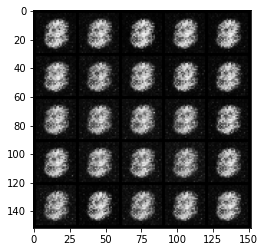

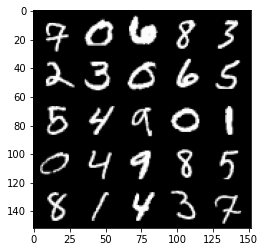

Step 1000: Generator loss: 1.7554284009933478, discriminator loss: 0.27884725311398467


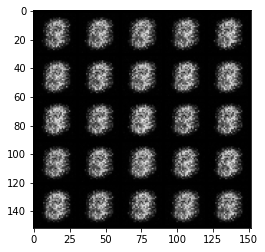

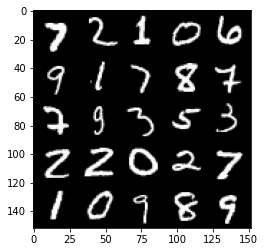

Step 1500: Generator loss: 2.066806416511535, discriminator loss: 0.15766451153159122


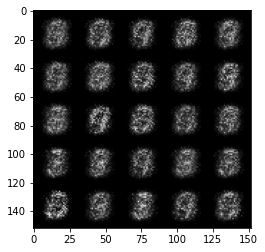

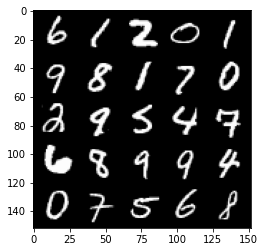

Step 2000: Generator loss: 1.6662463979721065, discriminator loss: 0.22863248178362863


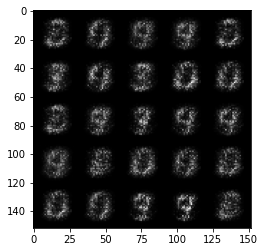

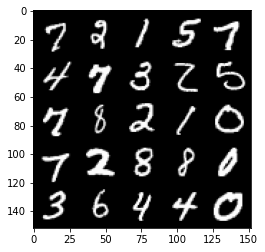

Step 2500: Generator loss: 1.6399240837097164, discriminator loss: 0.21086971548199657


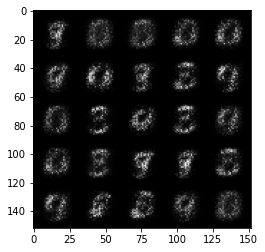

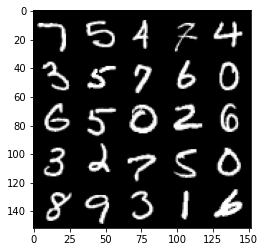

Step 3000: Generator loss: 1.899244476795195, discriminator loss: 0.17272505417466175


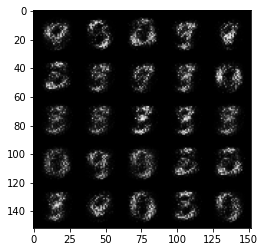

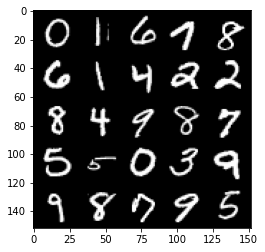

Step 3500: Generator loss: 2.3106402540206905, discriminator loss: 0.13722870843112472


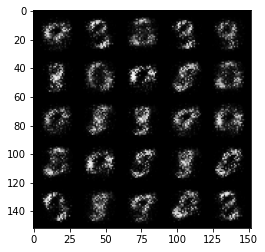

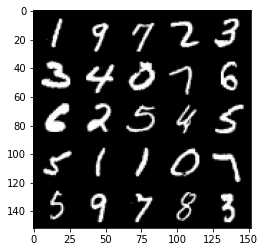

Step 4000: Generator loss: 2.7227097454071023, discriminator loss: 0.10677449494600297


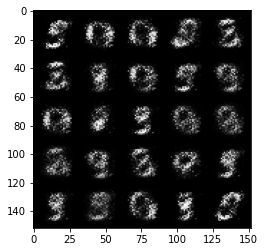

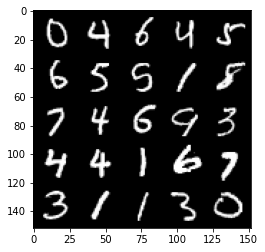

Step 4500: Generator loss: 3.2384149107933076, discriminator loss: 0.0812453537210822


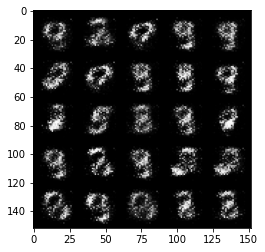

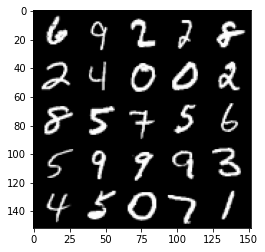

Step 5000: Generator loss: 3.5706180648803736, discriminator loss: 0.06707838854193682


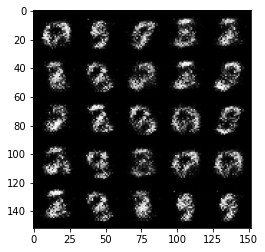

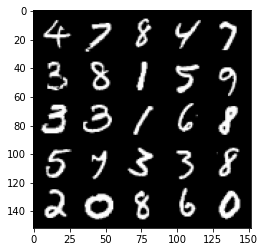

Step 5500: Generator loss: 3.7680699968338005, discriminator loss: 0.05436134556680919


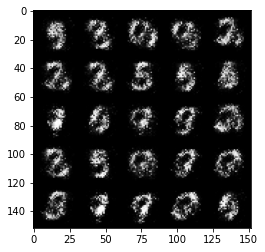

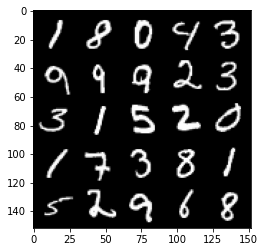

Step 6000: Generator loss: 4.011907943725587, discriminator loss: 0.054929990649223374


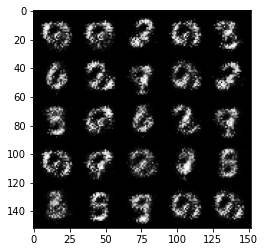

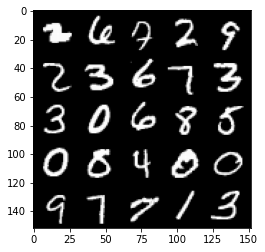

Step 6500: Generator loss: 4.032339243412017, discriminator loss: 0.05903058318793775


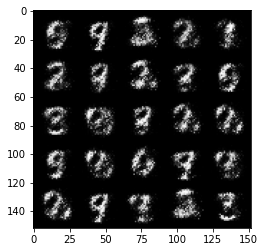

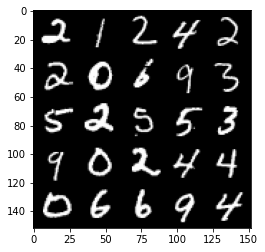

Step 7000: Generator loss: 4.264505360603328, discriminator loss: 0.0504153885580599


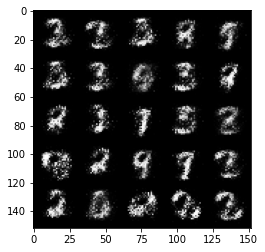

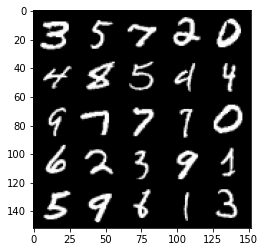

Step 7500: Generator loss: 4.274846090793611, discriminator loss: 0.04722150641679762


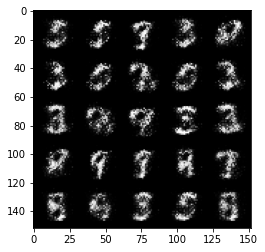

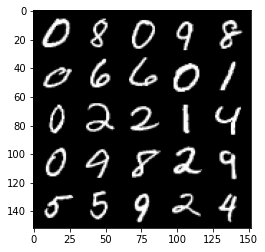

Step 8000: Generator loss: 4.31145672893524, discriminator loss: 0.05143182246759537


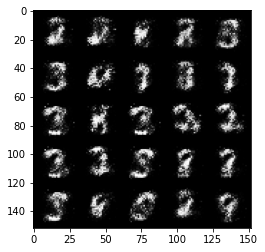

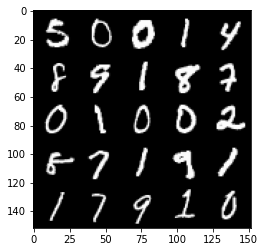

Step 8500: Generator loss: 4.347244293689727, discriminator loss: 0.050154596056789146


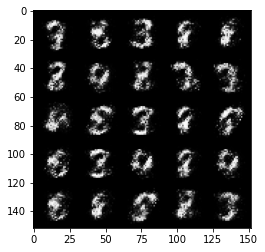

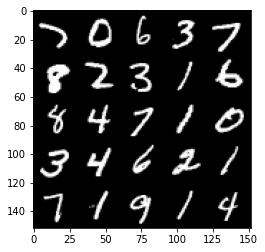

Step 9000: Generator loss: 4.326681984901428, discriminator loss: 0.04911176213994622


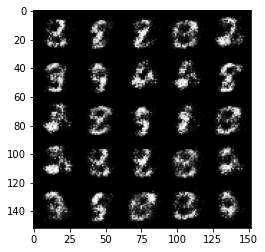

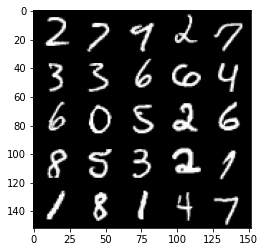

Step 9500: Generator loss: 4.479151055812841, discriminator loss: 0.046262106250971574


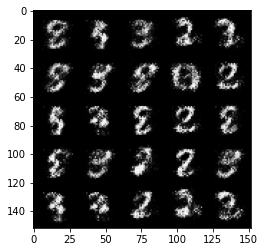

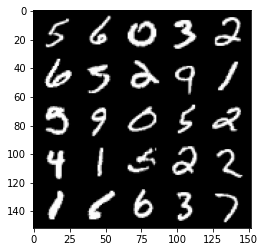

Step 10000: Generator loss: 4.388559288024901, discriminator loss: 0.04916306637600063


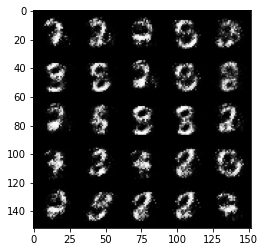

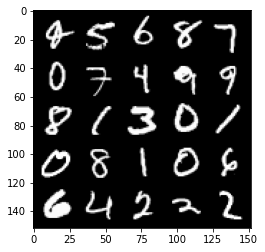

Step 10500: Generator loss: 4.303242732048039, discriminator loss: 0.05546344692260022


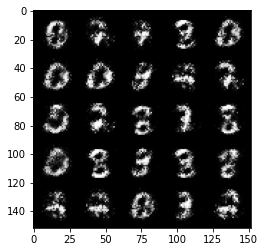

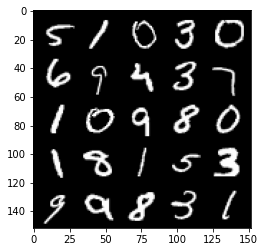

Step 11000: Generator loss: 4.310176470279692, discriminator loss: 0.06103730866312971


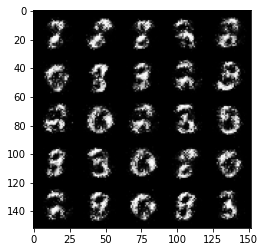

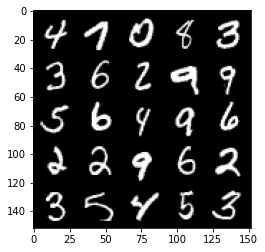

Step 11500: Generator loss: 4.442258524894709, discriminator loss: 0.056246666960418246


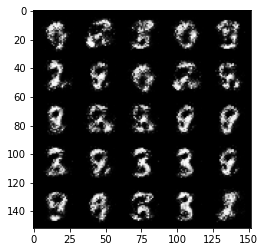

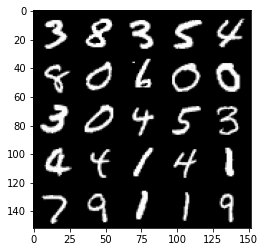

Step 12000: Generator loss: 4.386194765090944, discriminator loss: 0.05925422615930438


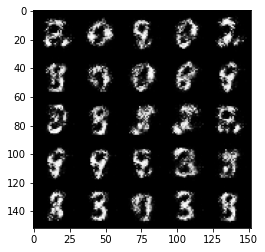

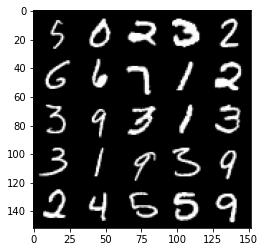

Step 12500: Generator loss: 4.212735916614531, discriminator loss: 0.06732436999306078


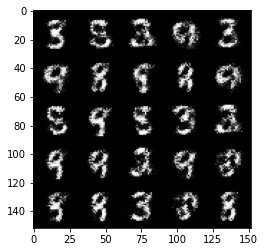

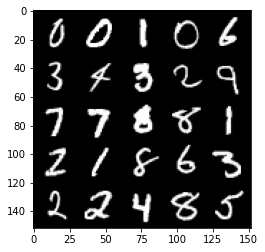

Step 13000: Generator loss: 4.100035430431366, discriminator loss: 0.07855737820267682


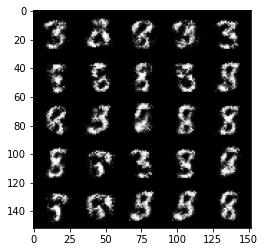

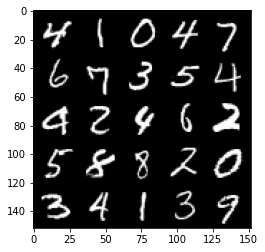

Step 13500: Generator loss: 4.121538068771362, discriminator loss: 0.07751067378371959


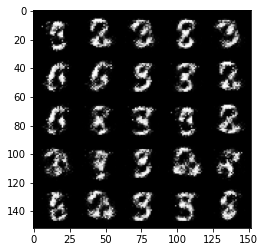

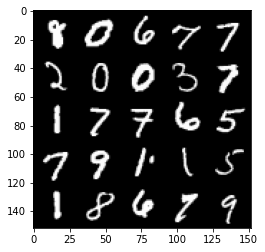

Step 14000: Generator loss: 4.277766174793241, discriminator loss: 0.08649601790308944


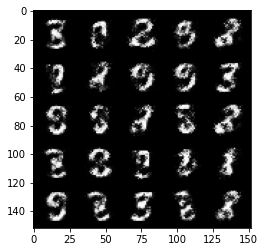

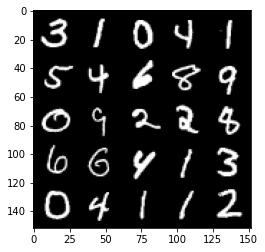

Step 14500: Generator loss: 4.112933454513547, discriminator loss: 0.09287597954273219


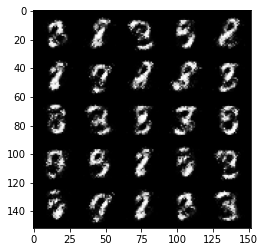

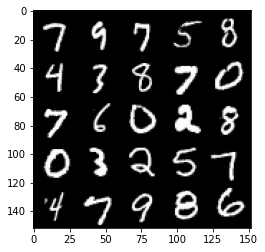

Step 15000: Generator loss: 4.150104279994965, discriminator loss: 0.09955502347648135


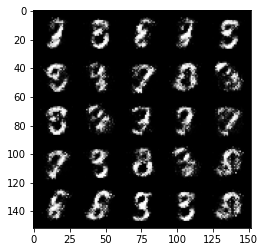

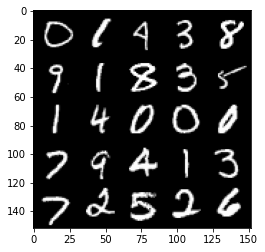

Step 15500: Generator loss: 3.9087575445175204, discriminator loss: 0.09745326474308974


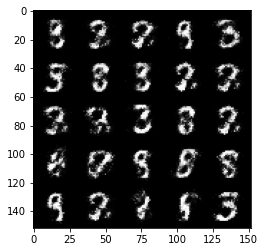

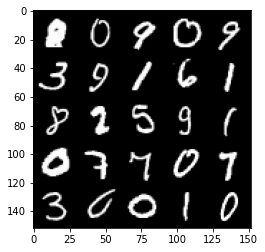

Step 16000: Generator loss: 3.8685634284019472, discriminator loss: 0.1031879765242337


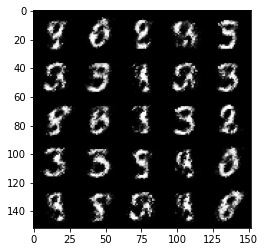

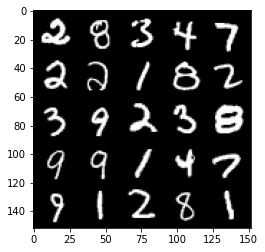

Step 16500: Generator loss: 3.595241517543796, discriminator loss: 0.11711871035397052


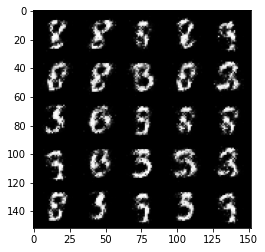

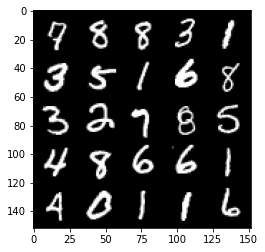

Step 17000: Generator loss: 3.683957593917847, discriminator loss: 0.10699152617901564


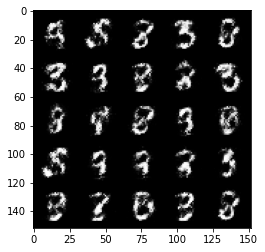

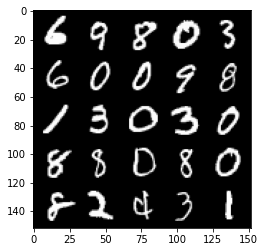

Step 17500: Generator loss: 3.8470779047012287, discriminator loss: 0.10986794679611935


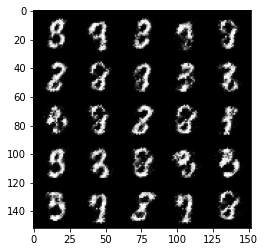

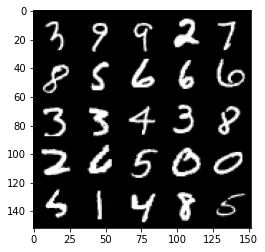

Step 18000: Generator loss: 3.785664056301118, discriminator loss: 0.09689943503588444


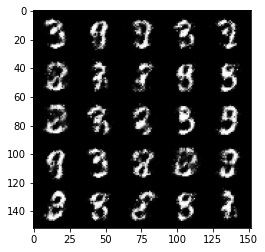

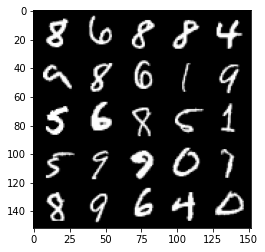

Step 18500: Generator loss: 3.7336126403808594, discriminator loss: 0.11634982099384078


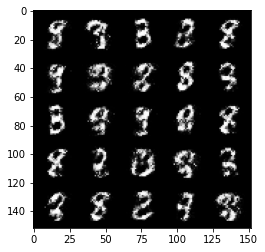

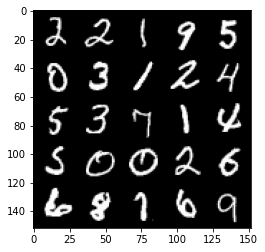

Step 19000: Generator loss: 3.6980264682769737, discriminator loss: 0.14069084680080401


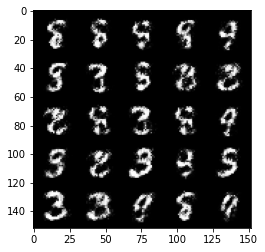

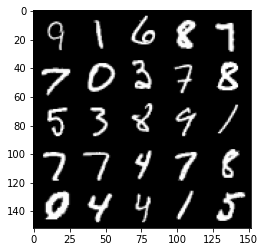

Step 19500: Generator loss: 3.4371632018089295, discriminator loss: 0.14028363965451696


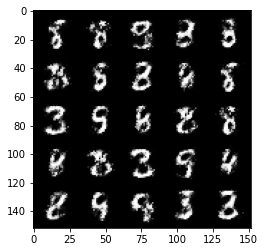

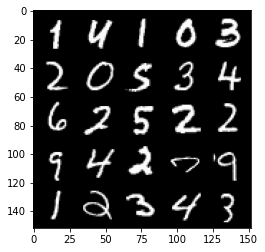

Step 20000: Generator loss: 3.3689884901046785, discriminator loss: 0.1480414446890355


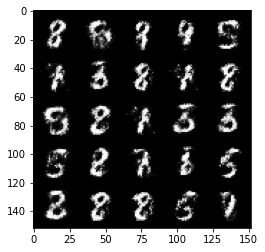

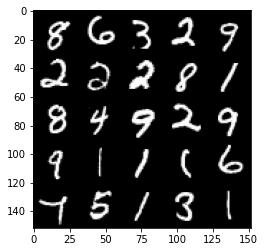

Step 20500: Generator loss: 3.390487171173091, discriminator loss: 0.13342610688507547


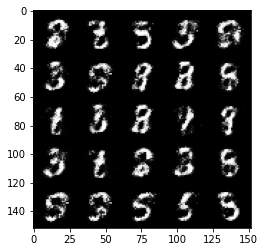

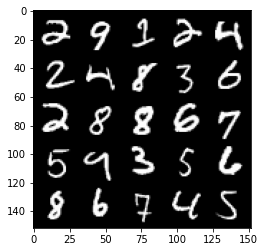

Step 21000: Generator loss: 3.5184931144714335, discriminator loss: 0.14389654055237758


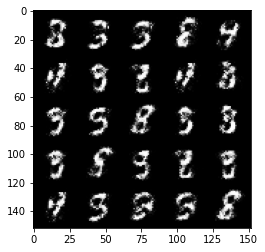

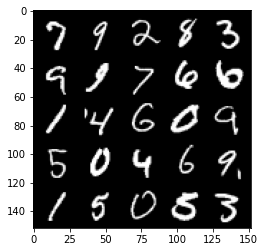

Step 21500: Generator loss: 3.391073613166811, discriminator loss: 0.1421533137410879


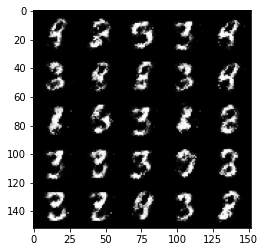

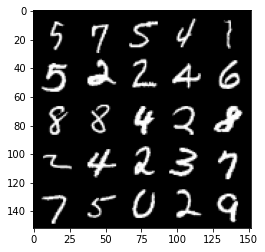

Step 22000: Generator loss: 3.3842922596931437, discriminator loss: 0.14126674903184178


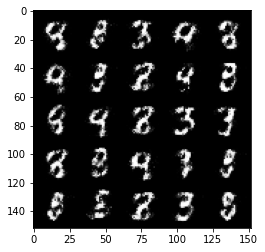

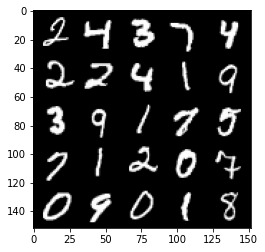

Step 22500: Generator loss: 3.253072617530825, discriminator loss: 0.14519785463809975


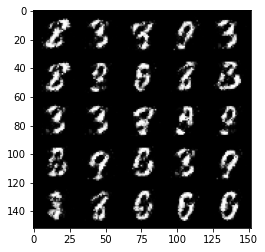

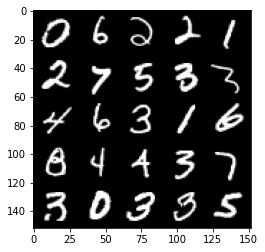

Step 23000: Generator loss: 3.1474528608322134, discriminator loss: 0.175904498651624


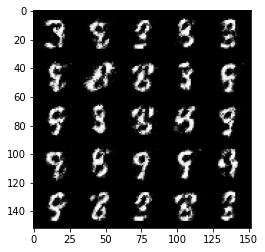

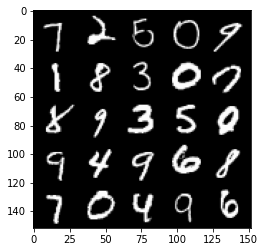

Step 23500: Generator loss: 3.299119510173799, discriminator loss: 0.14660483653843398


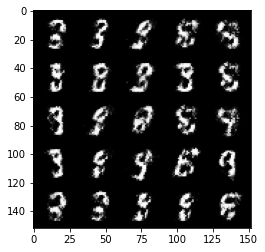

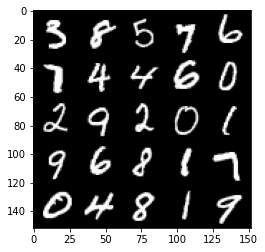

Step 24000: Generator loss: 3.164490534305571, discriminator loss: 0.16559738045930872


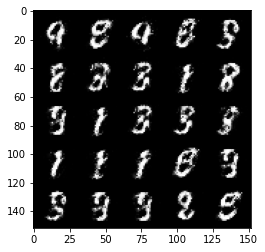

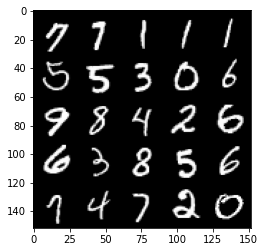

Step 24500: Generator loss: 3.105345592975615, discriminator loss: 0.17457808189094096


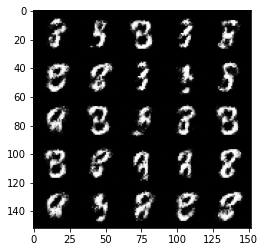

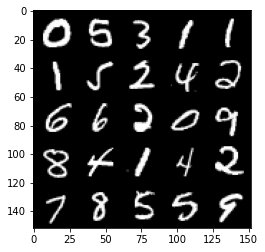

Step 25000: Generator loss: 3.1639008426666275, discriminator loss: 0.17209147453308105


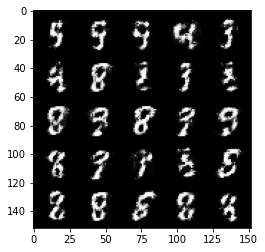

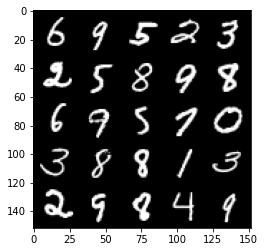

Step 25500: Generator loss: 3.0216128196716303, discriminator loss: 0.1724836412519219


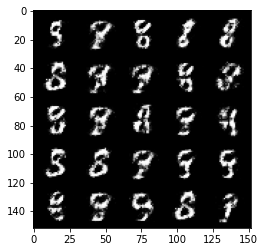

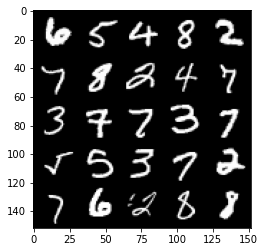

Step 26000: Generator loss: 2.937557420730589, discriminator loss: 0.1845010389685631


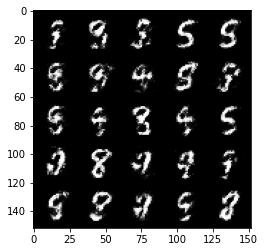

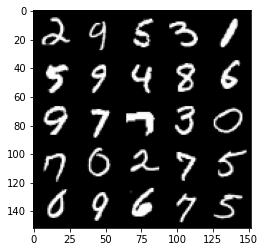

Step 26500: Generator loss: 2.8938502440452605, discriminator loss: 0.19125413671135913


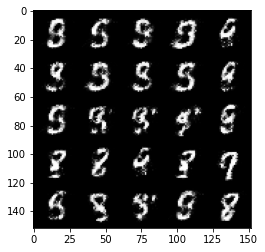

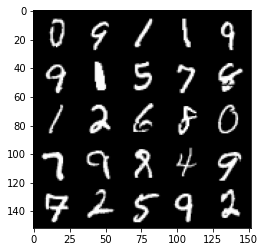

Step 27000: Generator loss: 2.8022977910041793, discriminator loss: 0.20477259768545628


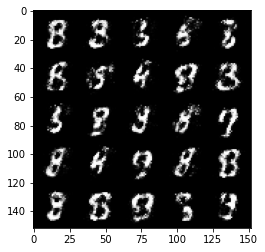

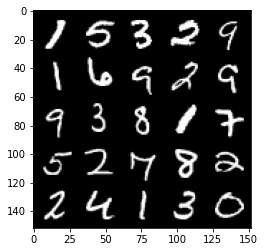

Step 27500: Generator loss: 2.880892180442809, discriminator loss: 0.1936598240286111


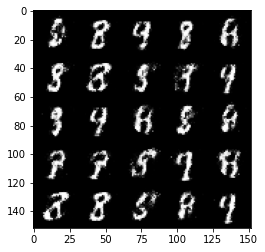

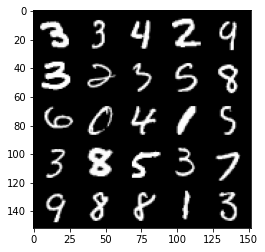

Step 28000: Generator loss: 2.837259704113003, discriminator loss: 0.2015671895742414


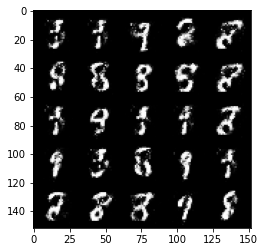

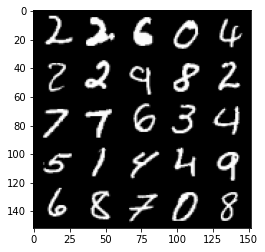

Step 28500: Generator loss: 2.7519224991798406, discriminator loss: 0.2031300784051417


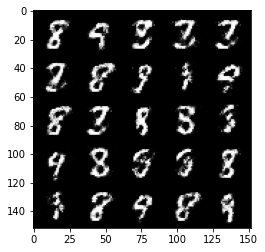

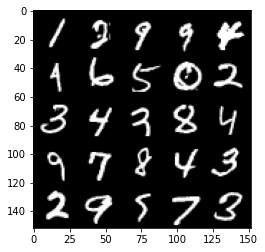

Step 29000: Generator loss: 2.651002069950104, discriminator loss: 0.2331500333547592


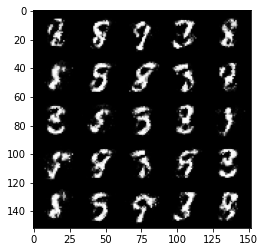

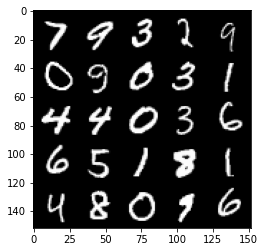

Step 29500: Generator loss: 2.765803920269012, discriminator loss: 0.20113727279007443


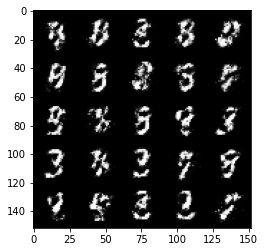

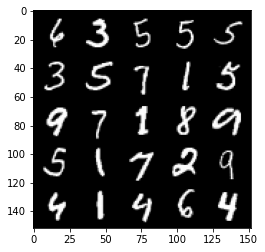

Step 30000: Generator loss: 2.8485413312912007, discriminator loss: 0.18362431335449225


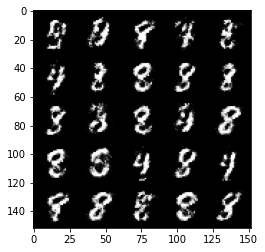

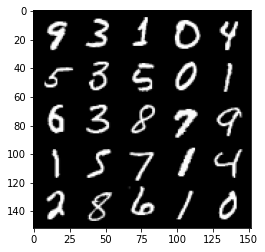

Step 30500: Generator loss: 2.7490488982200603, discriminator loss: 0.20505487471818926


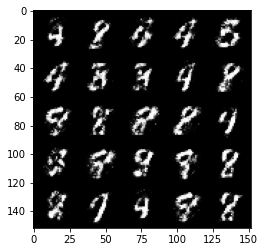

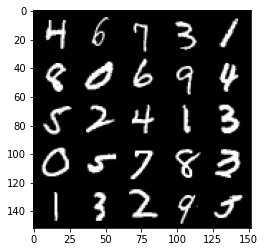

Step 31000: Generator loss: 2.670885209560392, discriminator loss: 0.21473619700968263


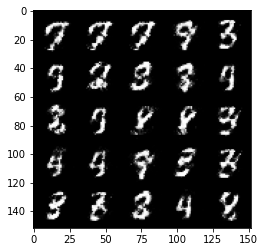

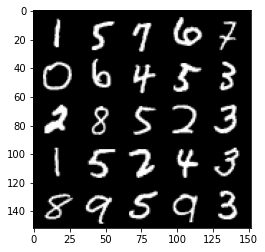

Step 31500: Generator loss: 2.6522238821983324, discriminator loss: 0.22597484332323073


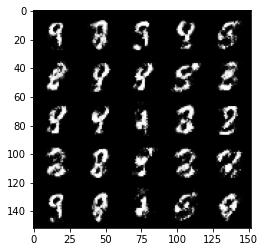

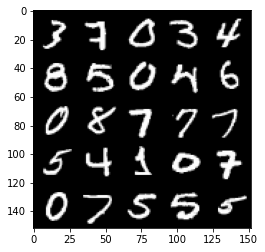

Step 32000: Generator loss: 2.594461077451706, discriminator loss: 0.22400791017711158


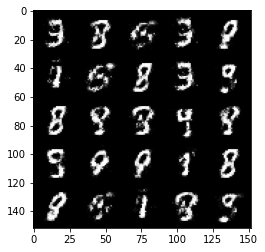

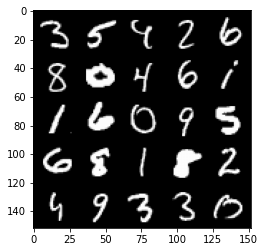

Step 32500: Generator loss: 2.6615301499366772, discriminator loss: 0.2324390415251256


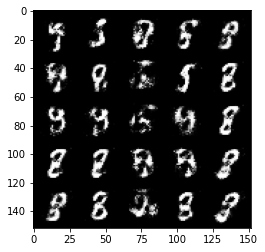

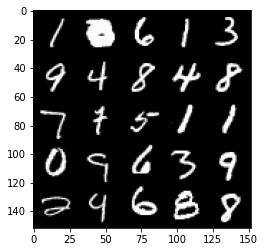

Step 33000: Generator loss: 2.5499841780662527, discriminator loss: 0.2484995495080946


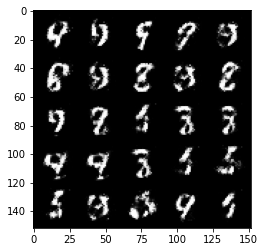

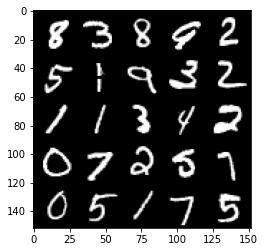

Step 33500: Generator loss: 2.5392471961975085, discriminator loss: 0.23880773597955712


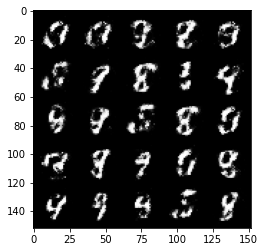

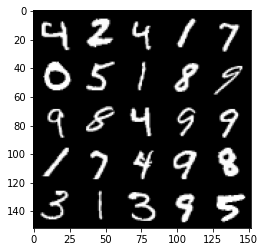

Step 34000: Generator loss: 2.495839341640474, discriminator loss: 0.25628745555877686


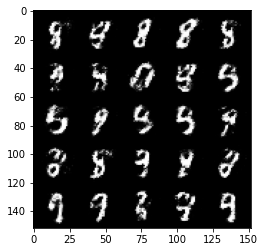

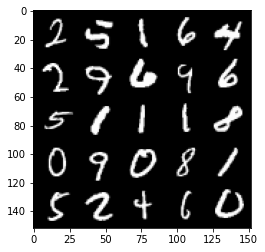

Step 34500: Generator loss: 2.3587385675907173, discriminator loss: 0.2825133809745311


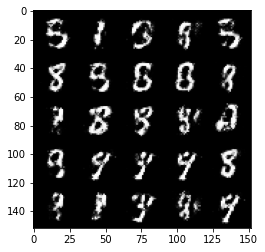

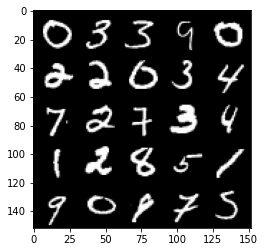

Step 35000: Generator loss: 2.3297763152122504, discriminator loss: 0.2784307878315447


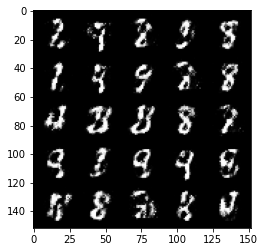

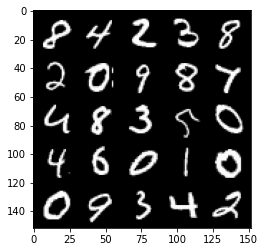

Step 35500: Generator loss: 2.3549768023490927, discriminator loss: 0.2555565035045147


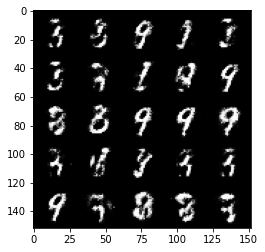

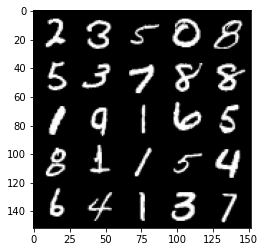

Step 36000: Generator loss: 2.2848331556320183, discriminator loss: 0.2711384445130825


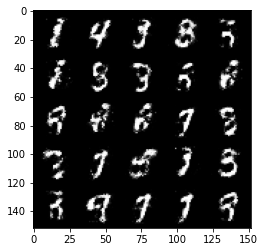

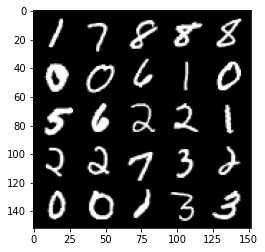

Step 36500: Generator loss: 2.428502138614654, discriminator loss: 0.249691570997238


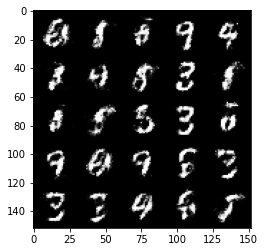

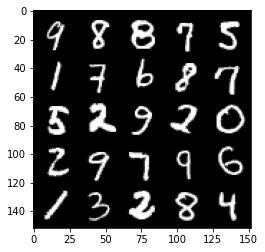

Step 37000: Generator loss: 2.4307681298255903, discriminator loss: 0.2599849918186663


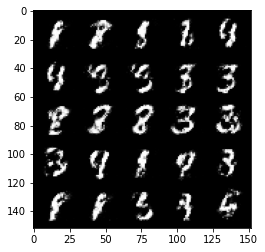

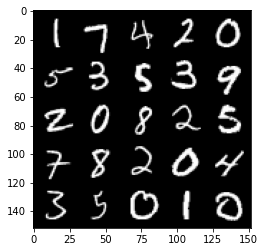

Step 37500: Generator loss: 2.256923038244249, discriminator loss: 0.28361955621838597


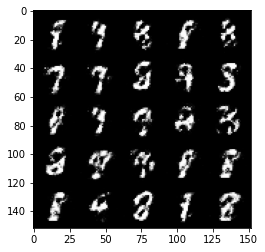

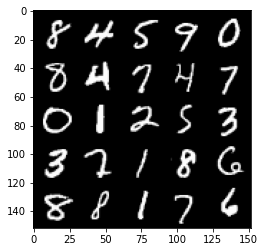

Step 38000: Generator loss: 2.163405358314514, discriminator loss: 0.2956279944777489


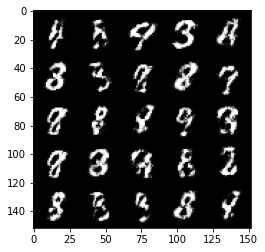

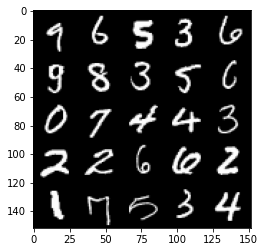

Step 38500: Generator loss: 2.2726268062591535, discriminator loss: 0.27156313538551335


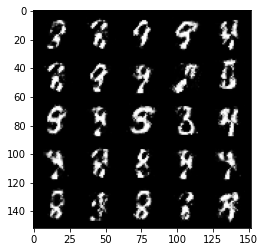

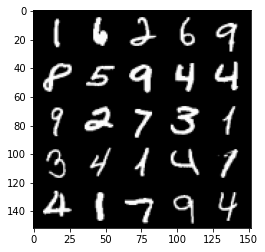

Step 39000: Generator loss: 2.205761406898497, discriminator loss: 0.27385517370700835


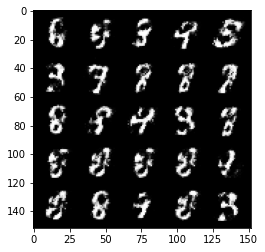

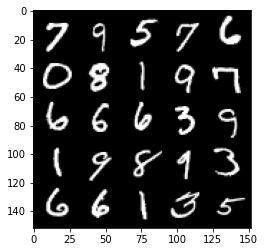

Step 39500: Generator loss: 2.1295267589092246, discriminator loss: 0.3089654228389264


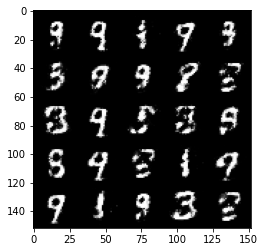

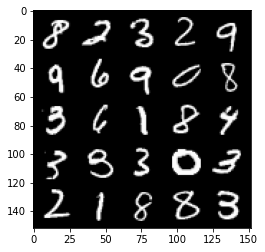

Step 40000: Generator loss: 2.10677127289772, discriminator loss: 0.29152255761623397


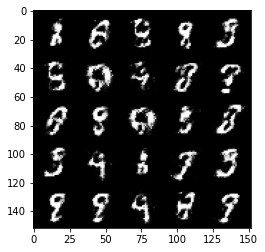

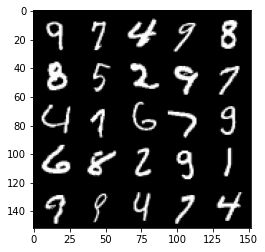

Step 40500: Generator loss: 2.1097386188507077, discriminator loss: 0.29442392310500154


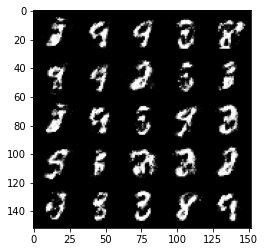

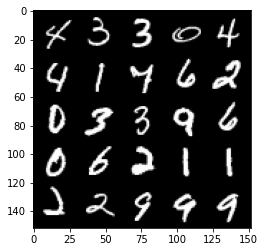

Step 41000: Generator loss: 2.0881600220203405, discriminator loss: 0.29868970161676434


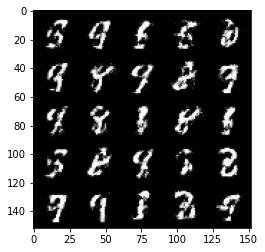

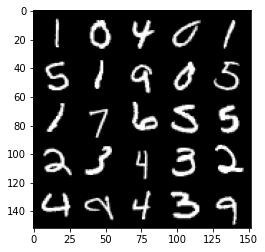

Step 41500: Generator loss: 2.264412217617034, discriminator loss: 0.26617935684323335


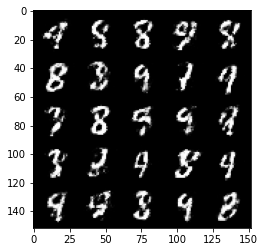

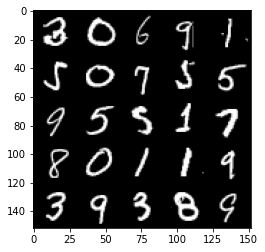

Step 42000: Generator loss: 2.082549678087234, discriminator loss: 0.303628420114517


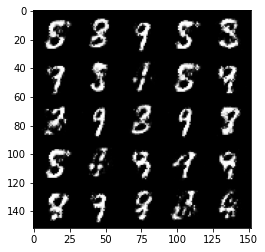

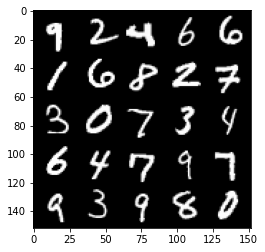

Step 42500: Generator loss: 2.1692596616745017, discriminator loss: 0.28596510019898413


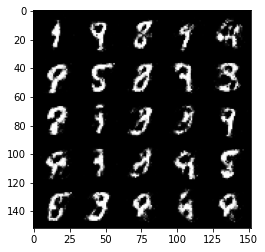

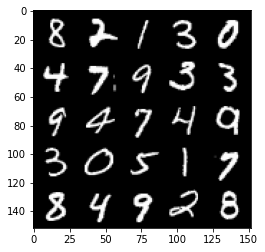

Step 43000: Generator loss: 2.1602324805259703, discriminator loss: 0.2751627212166787


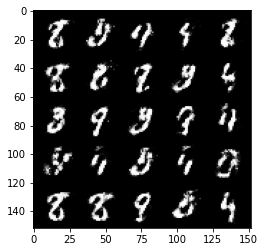

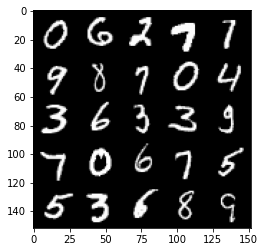

Step 43500: Generator loss: 2.2897656388282766, discriminator loss: 0.2560654879510402


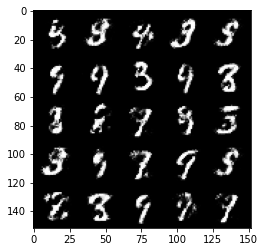

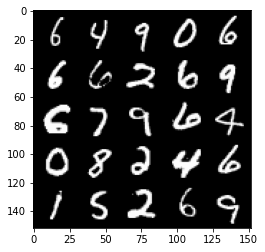

Step 44000: Generator loss: 2.0812887754440297, discriminator loss: 0.2940825190246102


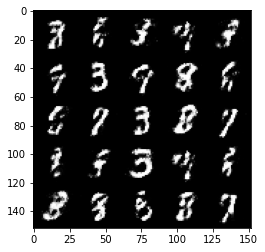

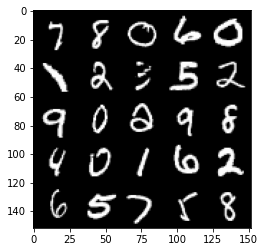

Step 44500: Generator loss: 2.082955331802369, discriminator loss: 0.2855156477689745


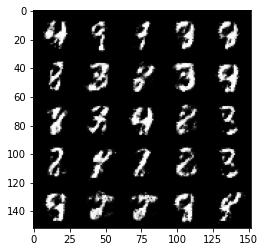

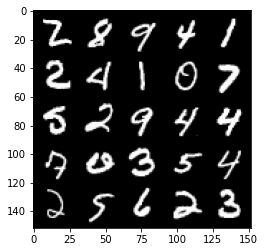

Step 45000: Generator loss: 2.087041092872621, discriminator loss: 0.28683861568570107


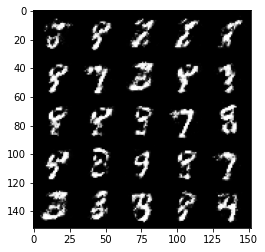

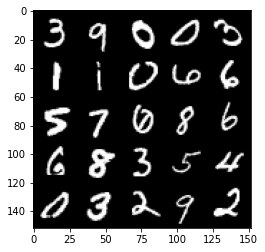

Step 45500: Generator loss: 2.0861019480228418, discriminator loss: 0.29405682331323607


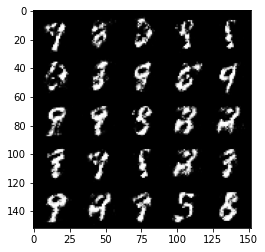

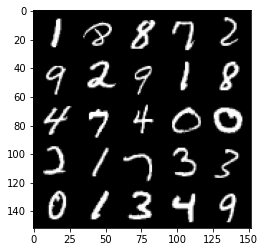

Step 46000: Generator loss: 2.1758271739482873, discriminator loss: 0.28254712381958935


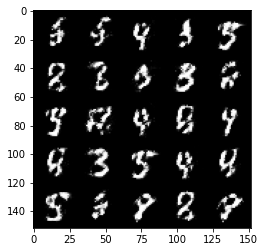

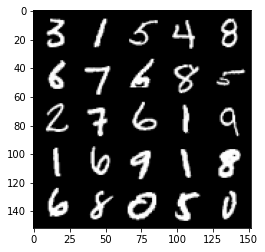

Step 46500: Generator loss: 2.0133571307659146, discriminator loss: 0.3122420865893362


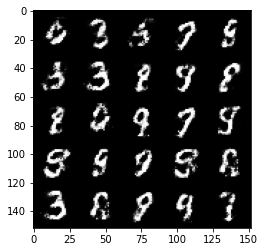

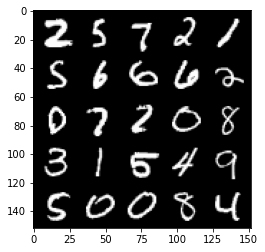

Step 47000: Generator loss: 2.044221813440322, discriminator loss: 0.3133377236127853


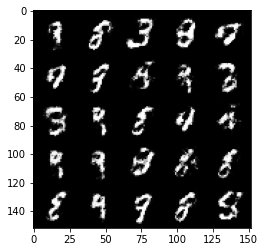

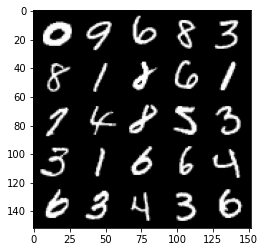

Step 47500: Generator loss: 2.0359205532073967, discriminator loss: 0.3022412984371186


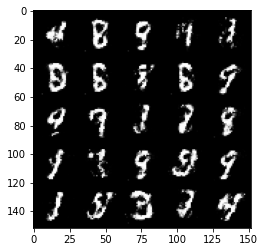

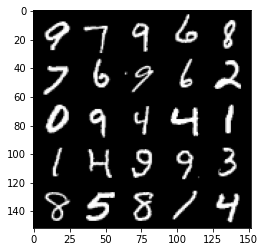

Step 48000: Generator loss: 2.116590765237807, discriminator loss: 0.27590352544188523


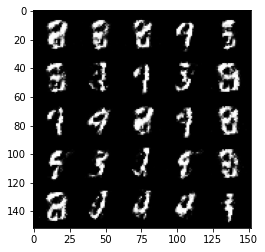

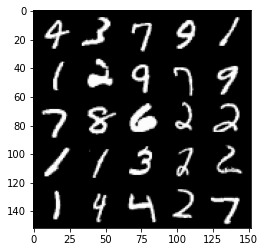

Step 48500: Generator loss: 2.154788755655289, discriminator loss: 0.2845395994186404


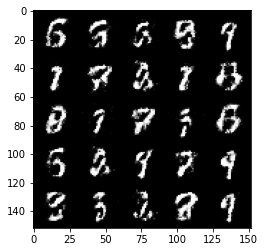

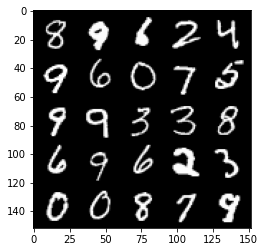

Step 49000: Generator loss: 2.1856153149604802, discriminator loss: 0.27392635309696217


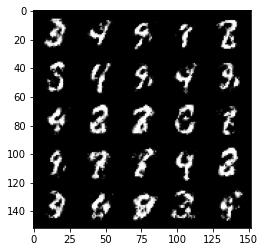

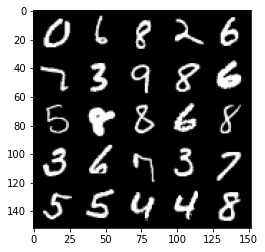

Step 49500: Generator loss: 2.005007467031479, discriminator loss: 0.3325545000433923


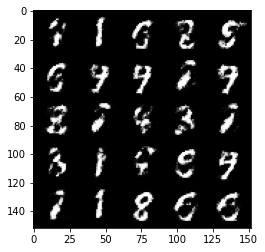

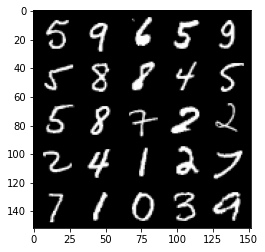

Step 50000: Generator loss: 1.9501270122528063, discriminator loss: 0.3212100823819634


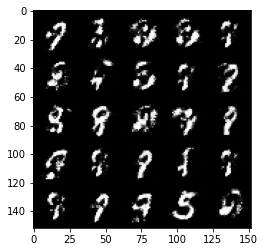

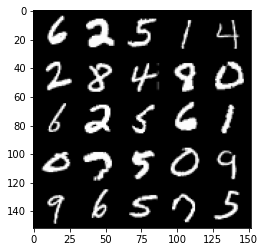

Step 50500: Generator loss: 2.051240098953249, discriminator loss: 0.30322474443912506


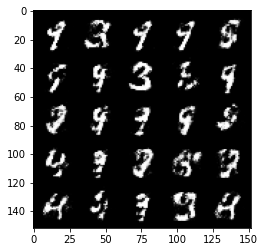

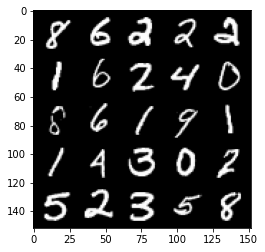

Step 51000: Generator loss: 2.0796588275432586, discriminator loss: 0.29105663537979104


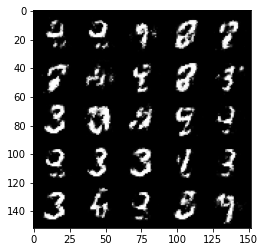

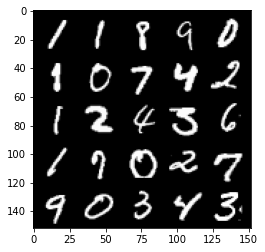

Step 51500: Generator loss: 2.083674181938173, discriminator loss: 0.29385386317968404


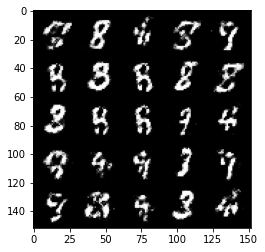

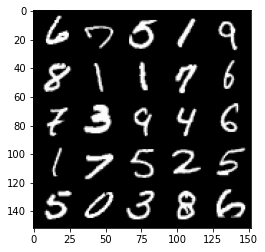

Step 52000: Generator loss: 2.099779807567597, discriminator loss: 0.30248564711213094


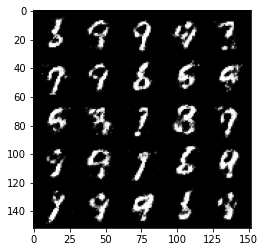

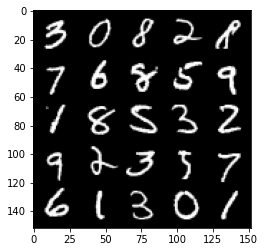

Step 52500: Generator loss: 1.9842466864585853, discriminator loss: 0.31590972280502305


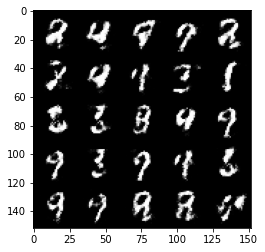

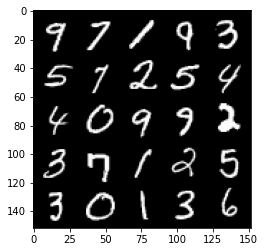

Step 53000: Generator loss: 1.9097383568286888, discriminator loss: 0.3421177681982518


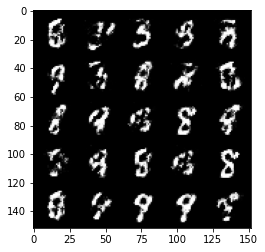

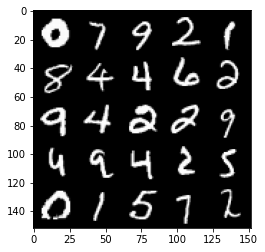

Step 53500: Generator loss: 1.897420893669129, discriminator loss: 0.3303670530021193


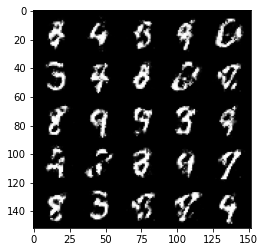

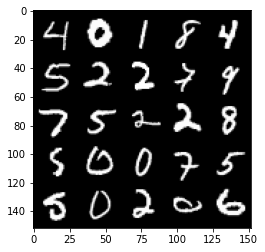

Step 54000: Generator loss: 1.8513689515590683, discriminator loss: 0.3539946226179602


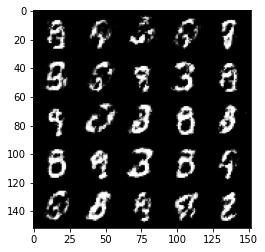

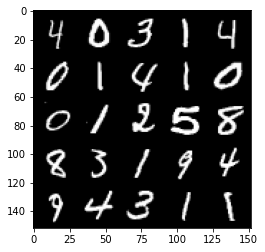

Step 54500: Generator loss: 1.8519350643157955, discriminator loss: 0.3319096322357655


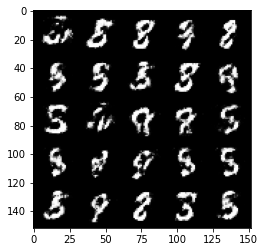

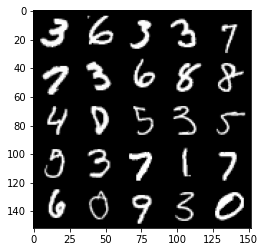

Step 55000: Generator loss: 1.8841273252964015, discriminator loss: 0.32601405280828444


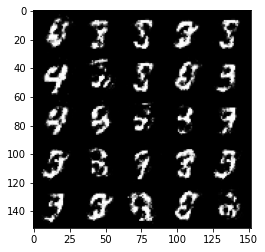

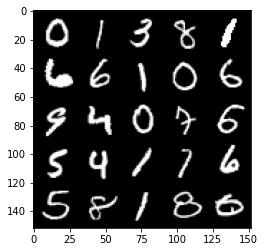

Step 55500: Generator loss: 1.7769635300636297, discriminator loss: 0.3613360880017282


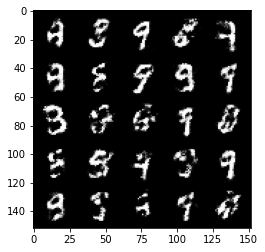

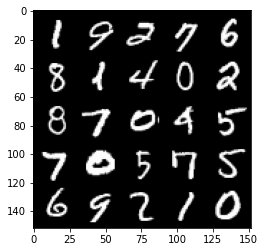

Step 56000: Generator loss: 1.7023824236392966, discriminator loss: 0.3662364017367363


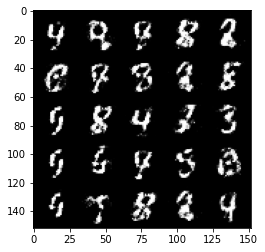

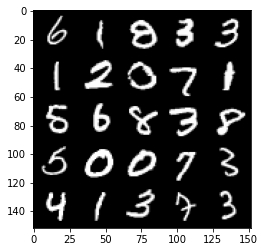

Step 56500: Generator loss: 1.879248080968857, discriminator loss: 0.32835434901714355


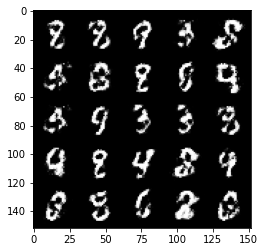

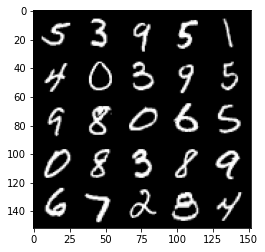

Step 57000: Generator loss: 1.9230667915344237, discriminator loss: 0.31649441254138955


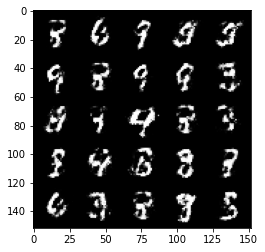

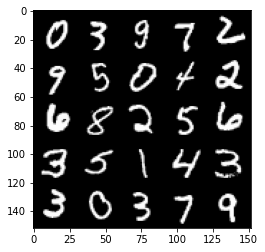

Step 57500: Generator loss: 1.904146327733993, discriminator loss: 0.3118504734039308


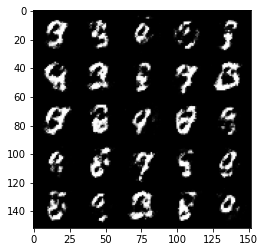

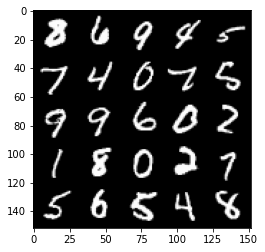

Step 58000: Generator loss: 1.9731382238864892, discriminator loss: 0.31301663652062384


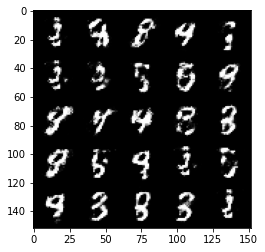

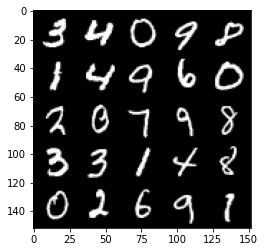

Step 58500: Generator loss: 1.891583906412124, discriminator loss: 0.3260189807713032


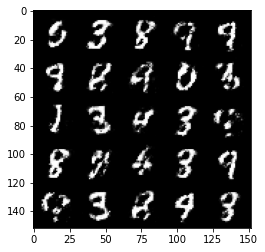

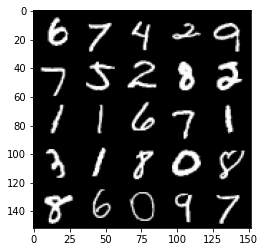

Step 59000: Generator loss: 1.8432673604488377, discriminator loss: 0.32910639408230746


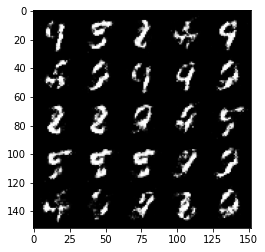

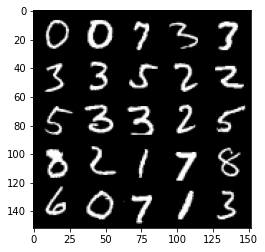

Step 59500: Generator loss: 1.9440954420566547, discriminator loss: 0.3184168951213361


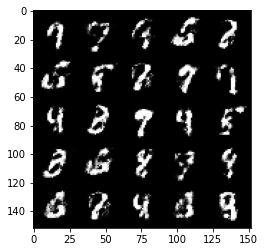

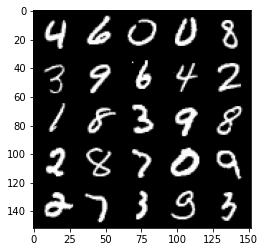

Step 60000: Generator loss: 1.7577417516708365, discriminator loss: 0.36228507196903204


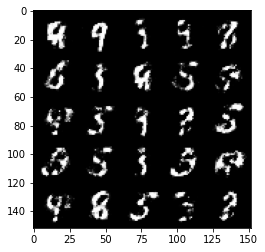

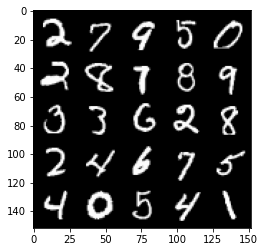

Step 60500: Generator loss: 1.7598691363334655, discriminator loss: 0.3491115797162056


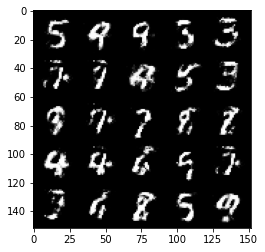

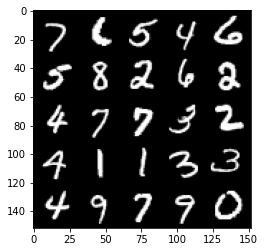

Step 61000: Generator loss: 1.6578359000682816, discriminator loss: 0.37898737430572527


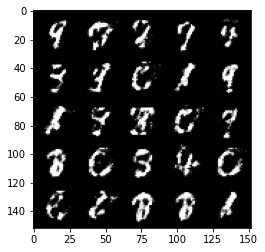

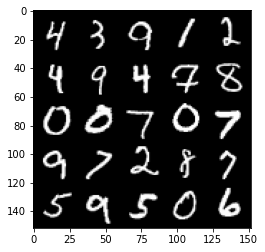

Step 61500: Generator loss: 1.86093913769722, discriminator loss: 0.3326643779575826


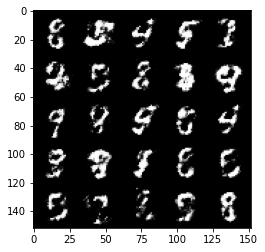

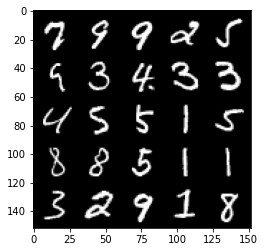

Step 62000: Generator loss: 1.7409254965782168, discriminator loss: 0.35497801333665874


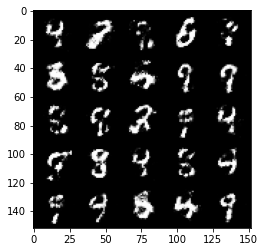

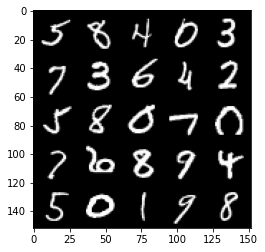

Step 62500: Generator loss: 1.7446909663677215, discriminator loss: 0.35772639891505276


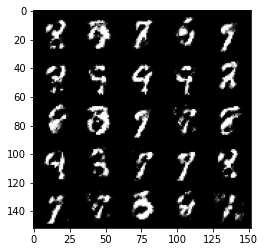

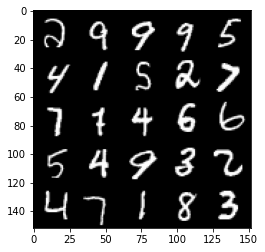

Step 63000: Generator loss: 1.750389060020447, discriminator loss: 0.3619788853526111


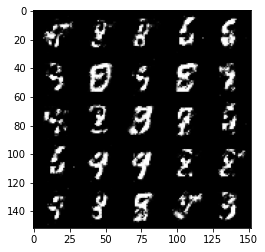

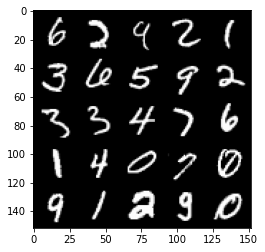

Step 63500: Generator loss: 1.6979066486358632, discriminator loss: 0.38054488533735287


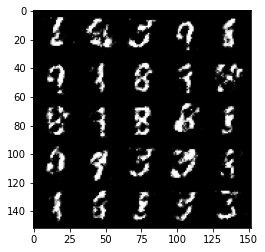

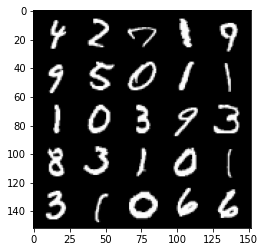

Step 64000: Generator loss: 1.683719695329667, discriminator loss: 0.3722755618691449


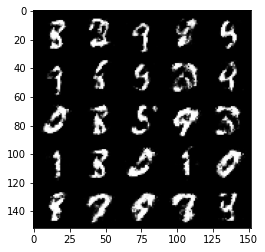

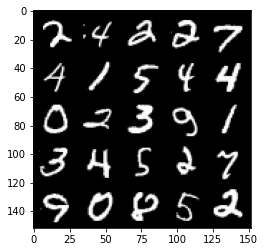

Step 64500: Generator loss: 1.6894605355262737, discriminator loss: 0.3683996390104296


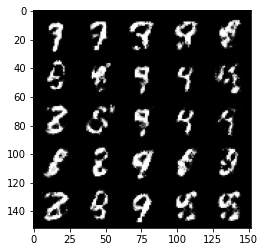

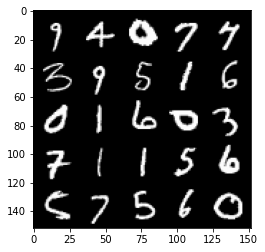

Step 65000: Generator loss: 1.7099950258731835, discriminator loss: 0.35634628552198383


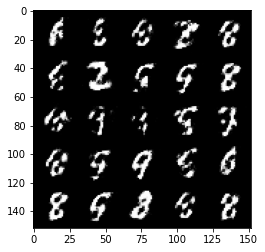

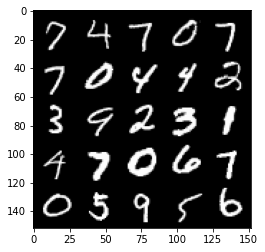

Step 65500: Generator loss: 1.7884351978302016, discriminator loss: 0.3505824740231037


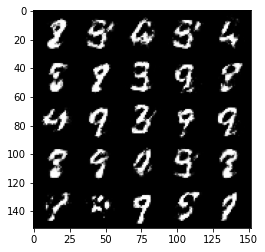

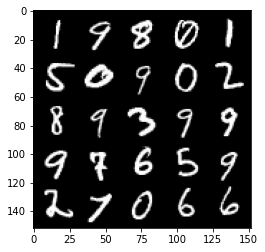

Step 66000: Generator loss: 1.813619435310363, discriminator loss: 0.34374137699604046


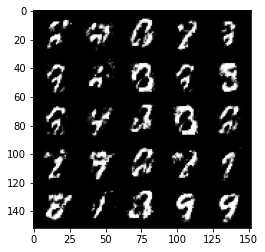

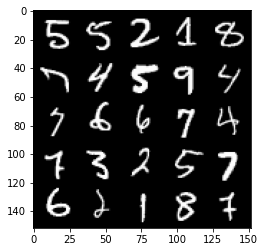

Step 66500: Generator loss: 1.7011900556087503, discriminator loss: 0.36001245206594457


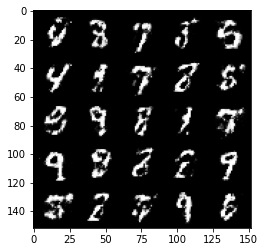

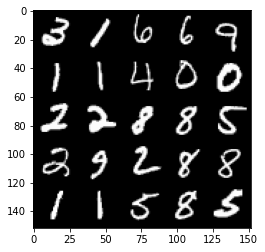

Step 67000: Generator loss: 1.6388154468536367, discriminator loss: 0.39096295380592366


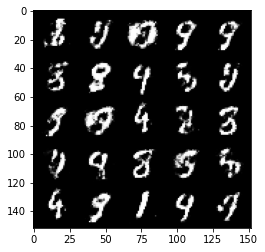

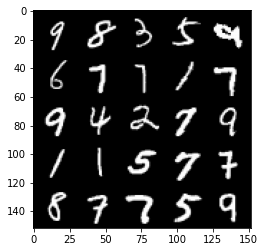

Step 67500: Generator loss: 1.5543112800121321, discriminator loss: 0.39771600520610817


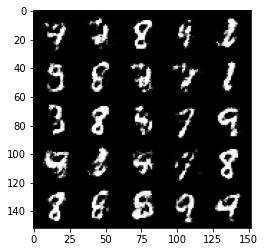

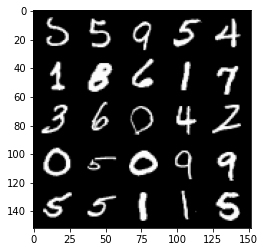

Step 68000: Generator loss: 1.6098573200702675, discriminator loss: 0.3876550329923631


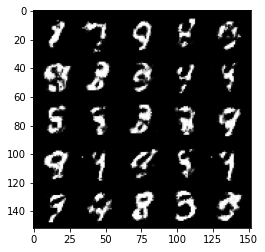

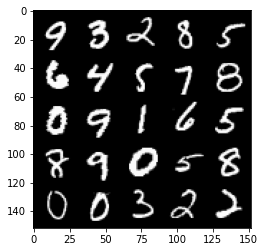

Step 68500: Generator loss: 1.5736984522342696, discriminator loss: 0.392336022138596


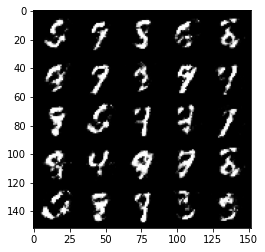

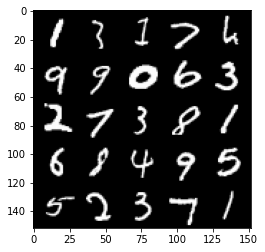

Step 69000: Generator loss: 1.5270603632926947, discriminator loss: 0.4055499528646468


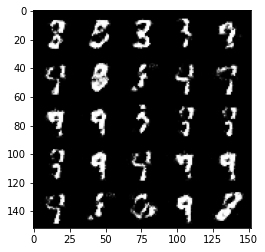

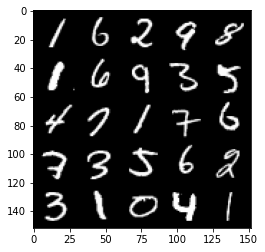

Step 69500: Generator loss: 1.6170207722187044, discriminator loss: 0.38064206057786965


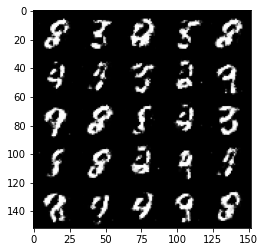

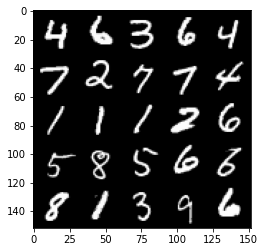

Step 70000: Generator loss: 1.579974505662917, discriminator loss: 0.39172522985935215


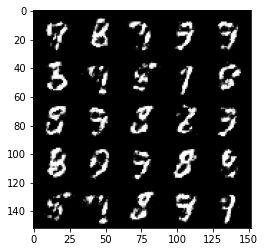

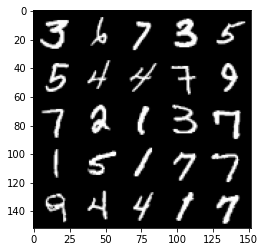

Step 70500: Generator loss: 1.6953105998039246, discriminator loss: 0.3572019833624366


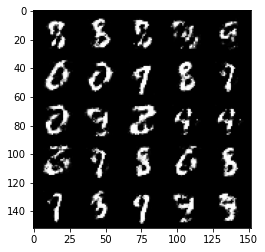

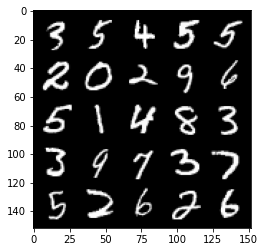

Step 71000: Generator loss: 1.7707650067806247, discriminator loss: 0.35608418527245533


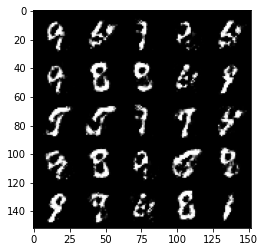

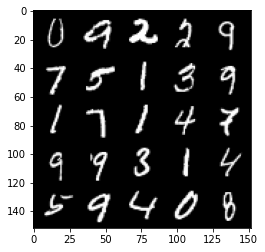

Step 71500: Generator loss: 1.5845976657867433, discriminator loss: 0.396580190181732


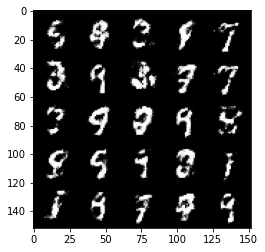

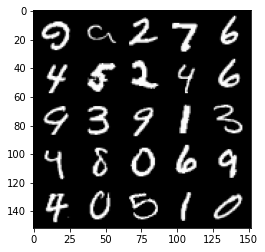

Step 72000: Generator loss: 1.580674849271775, discriminator loss: 0.40004631787538525


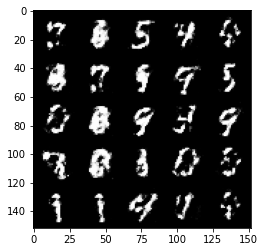

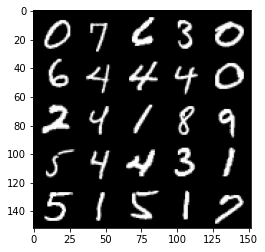

Step 72500: Generator loss: 1.5454446666240689, discriminator loss: 0.40383945000171717


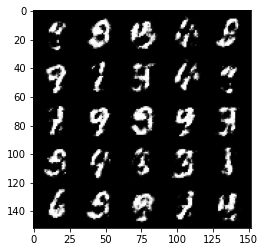

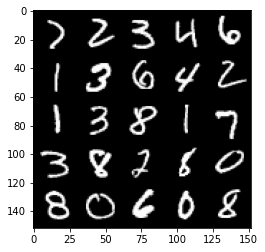

Step 73000: Generator loss: 1.6738978030681606, discriminator loss: 0.3652849447727206


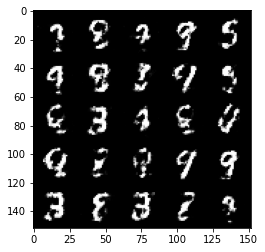

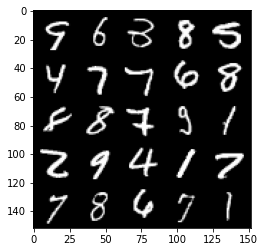

Step 73500: Generator loss: 1.626008657455445, discriminator loss: 0.3931375827193258


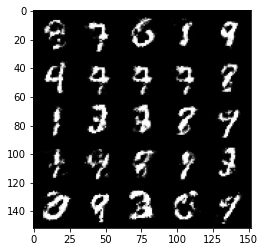

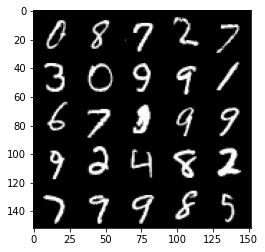

Step 74000: Generator loss: 1.580677132606506, discriminator loss: 0.3839338207244877


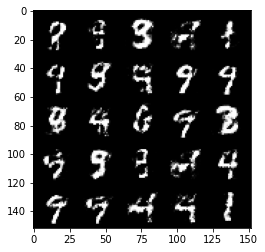

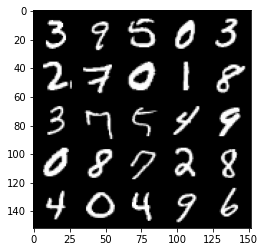

Step 74500: Generator loss: 1.5428025848865494, discriminator loss: 0.40189847308397286


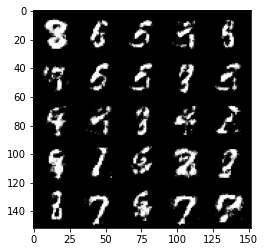

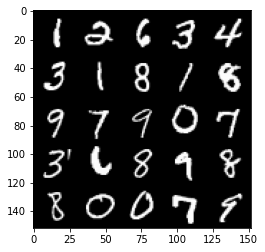

Step 75000: Generator loss: 1.500236866712572, discriminator loss: 0.41353685122728356


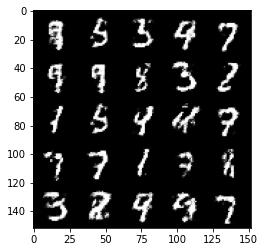

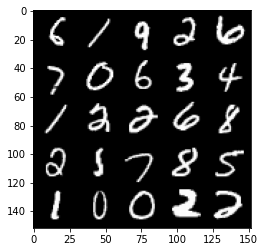

Step 75500: Generator loss: 1.4560037071704859, discriminator loss: 0.42701127177476866


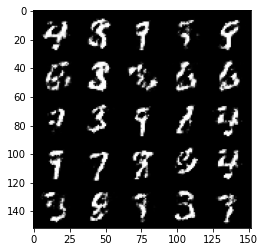

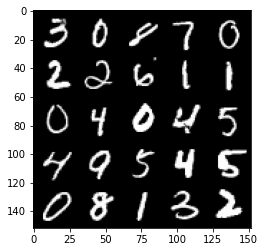

Step 76000: Generator loss: 1.5324172341823563, discriminator loss: 0.3965243088006973


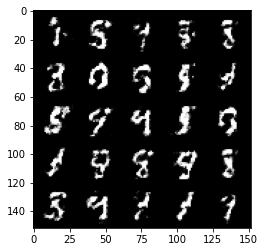

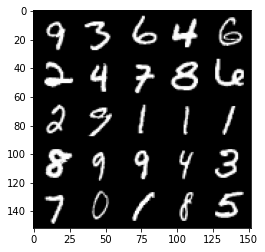

Step 76500: Generator loss: 1.6093838667869558, discriminator loss: 0.38925306010246286


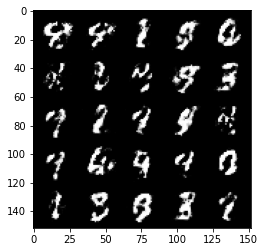

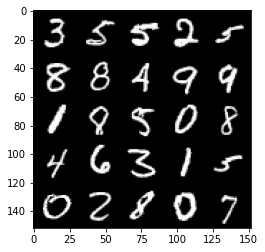

Step 77000: Generator loss: 1.6118232383728015, discriminator loss: 0.3730264353156091


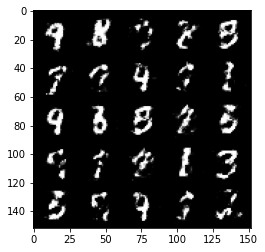

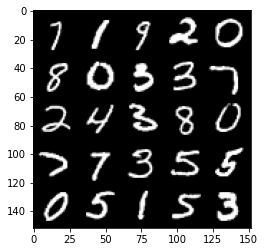

Step 77500: Generator loss: 1.615196417093276, discriminator loss: 0.3751405517458915


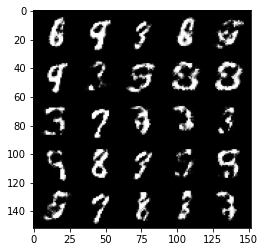

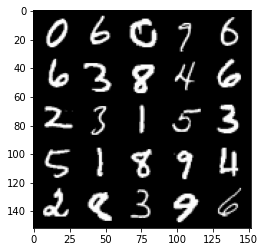

Step 78000: Generator loss: 1.5580768122673032, discriminator loss: 0.3959299584627146


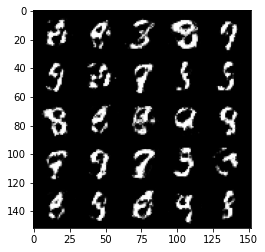

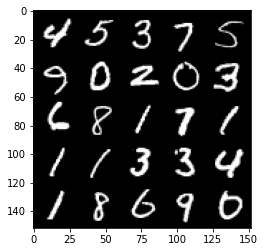

Step 78500: Generator loss: 1.5781012768745435, discriminator loss: 0.390161498785019


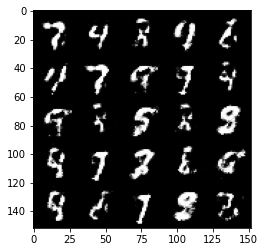

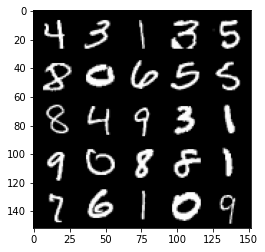

Step 79000: Generator loss: 1.5737313113212583, discriminator loss: 0.3895106940269469


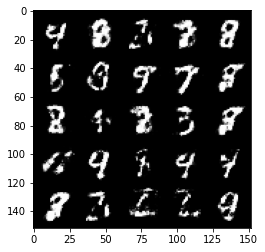

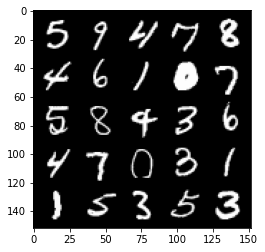

Step 79500: Generator loss: 1.4218588092327116, discriminator loss: 0.4347631154656412


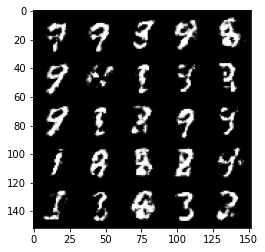

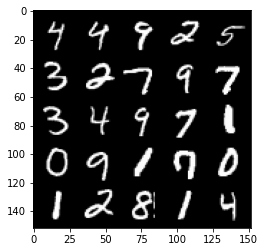

Step 80000: Generator loss: 1.4270435769557954, discriminator loss: 0.4274788316488263


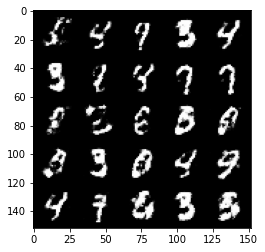

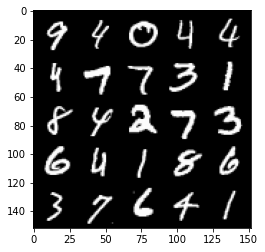

Step 80500: Generator loss: 1.4787192351818086, discriminator loss: 0.41984756845235854


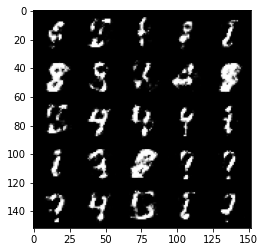

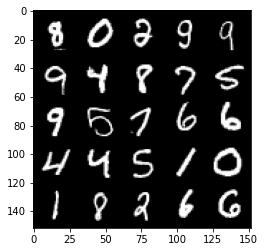

Step 81000: Generator loss: 1.4226885952949537, discriminator loss: 0.43363865685462955


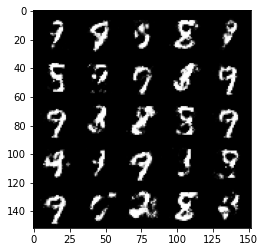

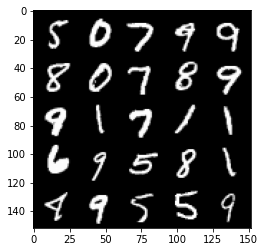

Step 81500: Generator loss: 1.5023472576141355, discriminator loss: 0.39367805129289624


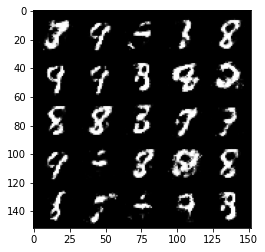

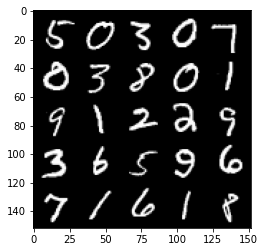

Step 82000: Generator loss: 1.5189084739685055, discriminator loss: 0.3950191002488135


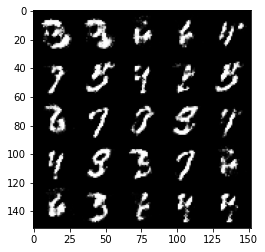

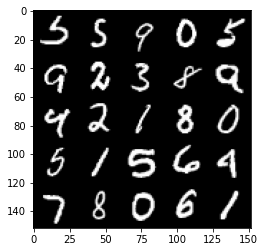

Step 82500: Generator loss: 1.5217236177921298, discriminator loss: 0.41249638026952756


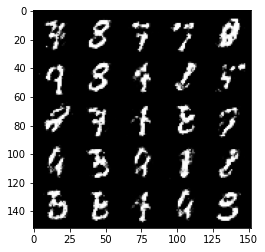

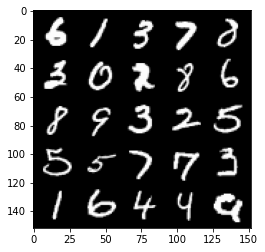

Step 83000: Generator loss: 1.4525124268531793, discriminator loss: 0.42998244458437007


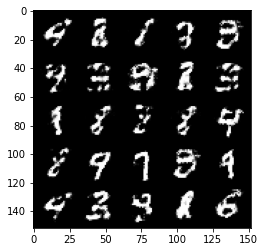

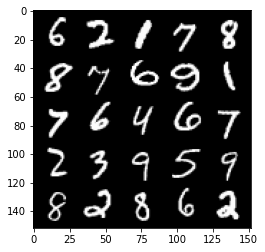

Step 83500: Generator loss: 1.41938813185692, discriminator loss: 0.4454393223524096


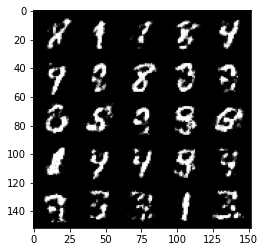

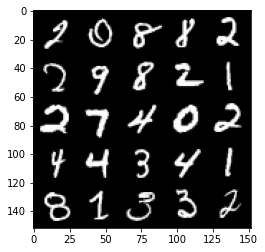

Step 84000: Generator loss: 1.4340351674556735, discriminator loss: 0.4284769865274426


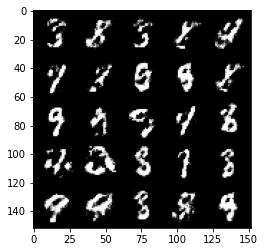

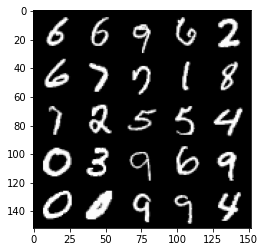

Step 84500: Generator loss: 1.462897915601731, discriminator loss: 0.42111341881751985


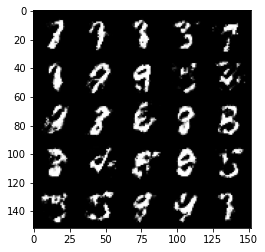

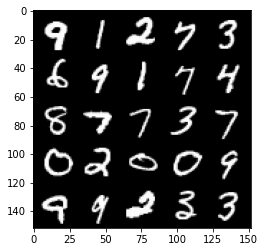

Step 85000: Generator loss: 1.4292754189968122, discriminator loss: 0.4422735357880592


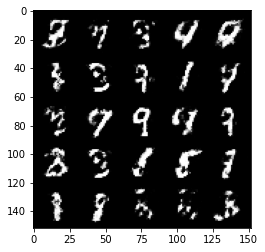

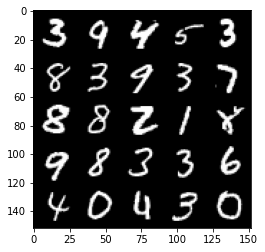

Step 85500: Generator loss: 1.322756976842881, discriminator loss: 0.4549863027334215


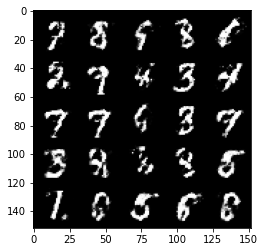

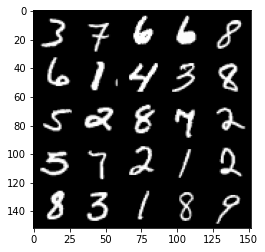

Step 86000: Generator loss: 1.318502777576447, discriminator loss: 0.4668567470908164


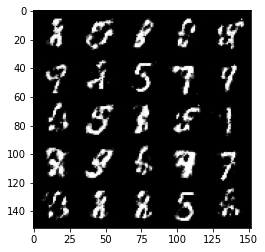

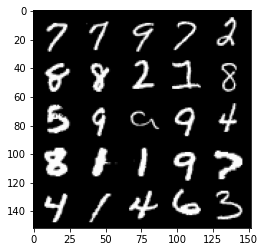

Step 86500: Generator loss: 1.349180255651474, discriminator loss: 0.44627929472923306


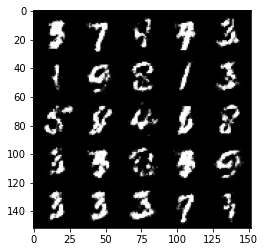

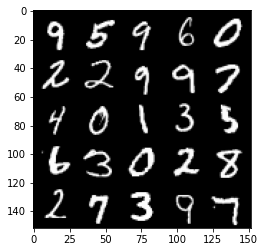

Step 87000: Generator loss: 1.3366399793624888, discriminator loss: 0.4618958794474605


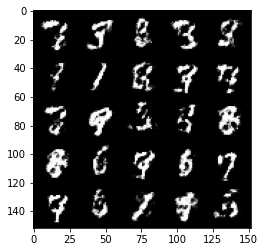

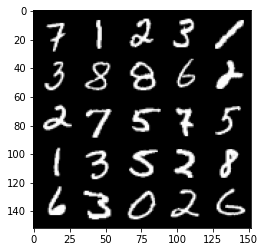

Step 87500: Generator loss: 1.2261450375318546, discriminator loss: 0.503512924849987


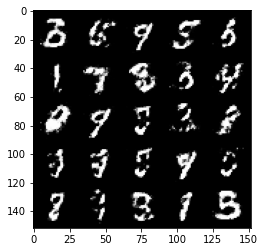

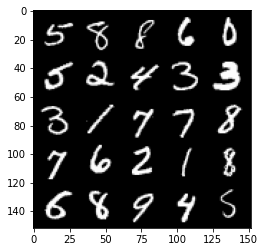

Step 88000: Generator loss: 1.239008511543273, discriminator loss: 0.47112578183412523


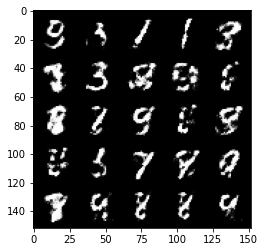

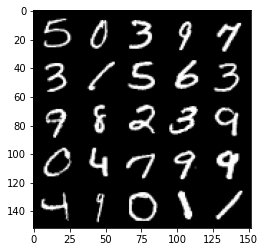

Step 88500: Generator loss: 1.213388674974441, discriminator loss: 0.4936706094741819


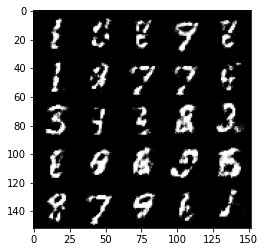

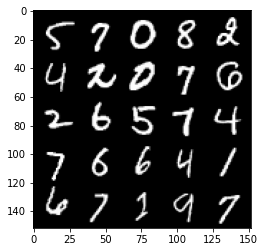

Step 89000: Generator loss: 1.2109616045951839, discriminator loss: 0.4944893475174903


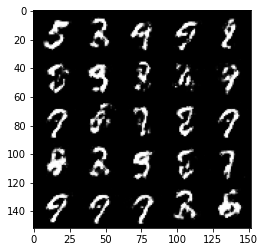

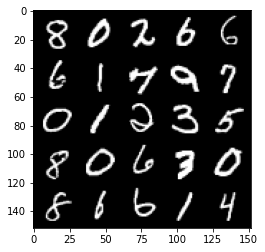

Step 89500: Generator loss: 1.254502887010574, discriminator loss: 0.4921651777029037


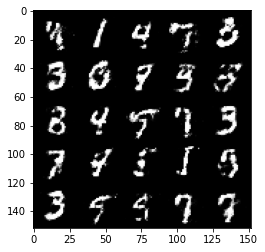

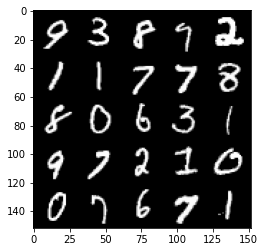

Step 90000: Generator loss: 1.1951918561458592, discriminator loss: 0.5118349066376685


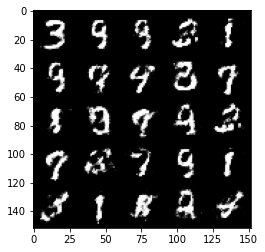

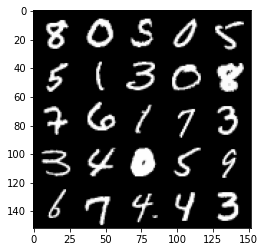

Step 90500: Generator loss: 1.2485682613849636, discriminator loss: 0.4864984055161476


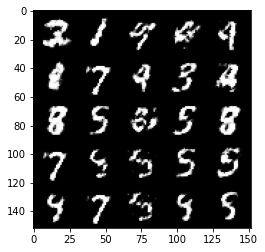

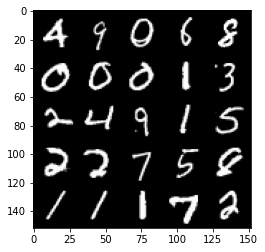

Step 91000: Generator loss: 1.3207405037879947, discriminator loss: 0.4472308335900306


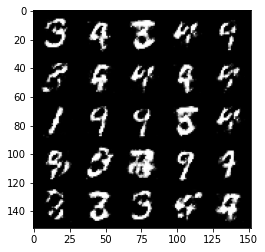

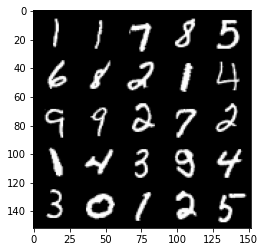

Step 91500: Generator loss: 1.3137646639347067, discriminator loss: 0.45426455271244065


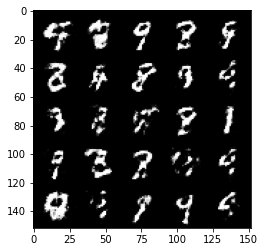

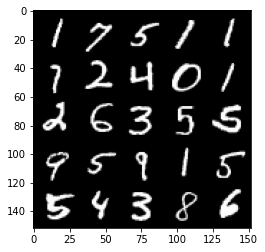

Step 92000: Generator loss: 1.297400416851045, discriminator loss: 0.4657532835602762


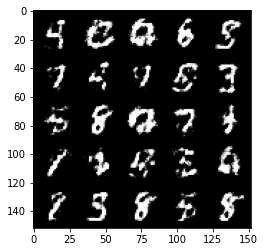

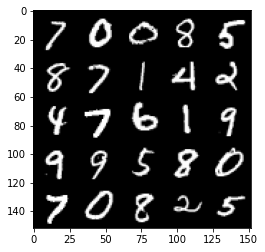

Step 92500: Generator loss: 1.2765569152832021, discriminator loss: 0.4732813312411307


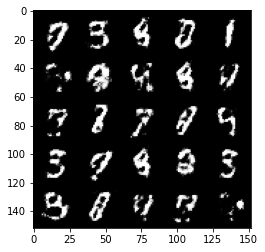

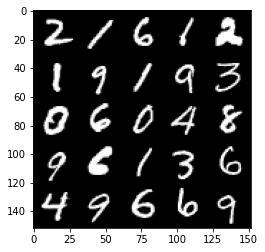

Step 93000: Generator loss: 1.3004028811454773, discriminator loss: 0.4617787327170372


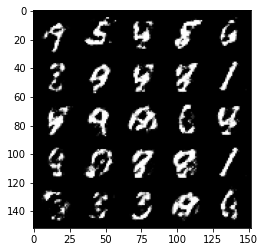

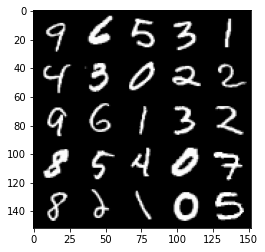

Step 93500: Generator loss: 1.2203036253452306, discriminator loss: 0.5010989997386931


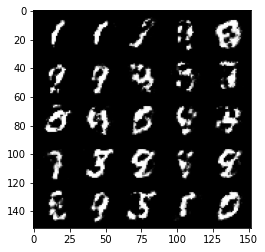

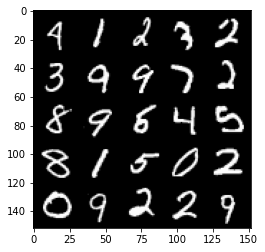

In [21]:
# UNQ_C8 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: 

cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0
test_generator = False # Whether the generator should be tested
gen_loss = False
for epoch in range(n_epochs):
  
    # Dataloader returns the batches
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)

        # Flatten the batch of real images from the dataset
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradients before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Update optimizer
        disc_opt.step()

        # For testing purposes, to keep track of the generator weights
        if test_generator:
            old_generator_weights = gen.gen[0][0].weight.detach().clone()

        ### Update generator ###
        #     Hint: This code will look a lot like the discriminator updates!
        #     These are the steps you will need to complete:
        #       1) Zero out the gradients.
        #       2) Calculate the generator loss, assigning it to gen_loss.
        #       3) Backprop through the generator: update the gradients and optimizer.
        #### START CODE HERE ####
        gen_opt.zero_grad()
        gen_loss = get_gen_loss(gen, disc, criterion, cur_batch_size, z_dim, device)
        gen_loss.backward(retain_graph=True)
        gen_opt.step()
        #### END CODE HERE ####

        # For testing purposes, to check that your code changes the generator weights
        if test_generator:
            assert torch.any(gen.gen[0][0].weight.detach().clone() != old_generator_weights)

        # Keep track of the average discriminator loss
        mean_discriminator_loss += disc_loss.item() / display_step

        # Keep track of the average generator loss
        mean_generator_loss += gen_loss.item() / display_step

        ### Visualization code ###
        if cur_step % display_step == 0 and cur_step > 0:
            print(f"Step {cur_step}: Generator loss: {mean_generator_loss}, discriminator loss: {mean_discriminator_loss}")
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            show_tensor_images(fake)
            show_tensor_images(real)
            mean_generator_loss = 0
            mean_discriminator_loss = 0
        cur_step += 1


In [ ]:











-AndrewsNG